# Analysis of the data - Traffic Volume from Quebec
> To iniate the analysis from this notebooke, please download the .xls files using the python file "telecharger_fichier.py" and save it in the same repository of this .ipynb file.  

### This notebook are organized in 3 sections:

- #### Section 1: First analysis of the data "Circulation Québec" that was downloaded using the "telecharger_fichier.py"
    - [Section 1.1 - Total of subfolders](#section-11---total-of-subfolders)
    - [Section 1.2 - Functions](#section-12---functions)
    - [Section 1.3 - Quantity of files](#section-2-aggregated-files-and-count-files-analysis)
        - [Section 1.3.1 - Quantity of files per year](#section-122---quantity-of-files-per-year)
        - [Section 1.3.2 - Bar plot of the count files per year ](#section-123---bar-plot-of-the-count-files-per-year)
        - [Section 1.3.3 Analysis using the files from the folders](#133-analysis-using-the-files-from-the-folders)
> 
- #### Section 2: Aggregated files and count files analysis 

    - [2.1 Geoanalysis and more](#evolution-of-data-collection-points-over-the-years)
    - 
>
- #### Section 3: Clustering and heat maps
    - In process




## Section 1 - First analysis

In [212]:
%%capture

import importlib
import MyFunctionsOpenQuebec

# Force a reload of the module
importlib.reload(MyFunctionsOpenQuebec)

In [213]:
# import packages
import os
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from MyFunctionsOpenQuebec import count_files, read_count_file, read_filtered_excel, aggregate_filtered_data, custom_mean, count_filtered_data, map_and_add_res_nm_reg

#### Section 1.1 - Total of subfolders
[Return](#section-1---first-analysis)
> The subfolders are named as the same ID of the sections on the route. It means that the quantity of subfolders are the quantity of route sections. 

In [65]:
# preview analysis of how much data for year we have per aggregated files and count files

# Specify the folder path
folder_path = 'debit_circulation_quebec2'  
# Get the list of subdirectories
subfolders = next(os.walk(folder_path))[1]

# Print the number of subfolders
print(f"The folder '{folder_path}' contains {len(subfolders)} subfolders.")



The folder 'debit_circulation_quebec2' contains 4888 subfolders.


#### Section 1.2 - Functions
[Return](#section-1---first-analysis)
- Function: 
    - count_files : interate over subfolders and count how many files we have in each subfolder
    - read_filtered_excel: Filter values and take files from each sheet inside the excel file
    - aggregate_filtered_data: Aggregated dataframe of all files filtered

##### Section 1.3 - Quantity of files
[Return](#section-1---first-analysis)

> The results shows that we can have sections with only subdolders of count files (données). And we have 649 sections with aggregated files.

In [66]:
# Using the count_files function to count the subfolders and the files
aggregated_folder_count, aggregated_file_count = count_files(folder_path, subfolders, prefix=subfolders, separator='_', suffix='.xlsx')
count_folder_count, count_file_count = count_files(folder_path, subfolders, prefix=subfolders, separator='-', suffix='donnees')

# Print the counts
print(f"Number of subfolders with aggregated files: {aggregated_folder_count}")
print(f"Total number of aggregated files: {aggregated_file_count}")

print(f"Number of subfolders with count files: {count_folder_count}")
print(f"Total number of count files: {count_file_count}")

Number of subfolders with aggregated files: 649
Total number of aggregated files: 3956
Number of subfolders with count files: 4850
Total number of count files: 10434


#### Section 1.3.1 - Quantity of files per year
[Return](#section-1---first-analysis)

> Separeted quantities of files per year and type of files (aggregated or count).

In [67]:
# Initialize dictionaries to store the counts per year
aggregated_files_per_year = {}
count_files_per_year = {}

# Iterate over subfolders
for subfolder in subfolders:
    # Get the list of files in the subfolder
    files = os.listdir(os.path.join(folder_path, subfolder))
    
    # Iterate over files in the subfolder
    for file in files:
        # Check if it's an aggregated file
        if file.startswith(subfolder) and '_' in file:
            year = file.split('_')[-1].split('.')[0]
            if year in aggregated_files_per_year:
                aggregated_files_per_year[year] += 1
            else:
                aggregated_files_per_year[year] = 1
        # Check if it's a count file
        if file.startswith(subfolder) and '-' in file and 'donnees' in file:
            year = file.split('-')[-2]
            if year in count_files_per_year:
                count_files_per_year[year] += 1
            else:
                count_files_per_year[year] = 1

# Print the counts per year for aggregated files
print("Aggregated Files per Year:")
for year, count in sorted(aggregated_files_per_year.items()):
    print(f"Year {year}: {count}")

# Print the counts per year for count files
print("Count Files per Year:")
for year, count in sorted(count_files_per_year.items()):
    print(f"Year {year}: {count}")

   

Aggregated Files per Year:
Year 2014: 359
Year 2015: 426
Year 2016: 453
Year 2017: 478
Year 2018: 483
Year 2019: 517
Year 2020: 484
Year 2021: 465
Year 2022: 291
Count Files per Year:
Year 2018: 2367
Year 2019: 2394
Year 2020: 1765
Year 2021: 1960
Year 2022: 1948


#### Section 1.3.2 - Bar plot of the count files per year
[Return](#section-1---first-analysis)

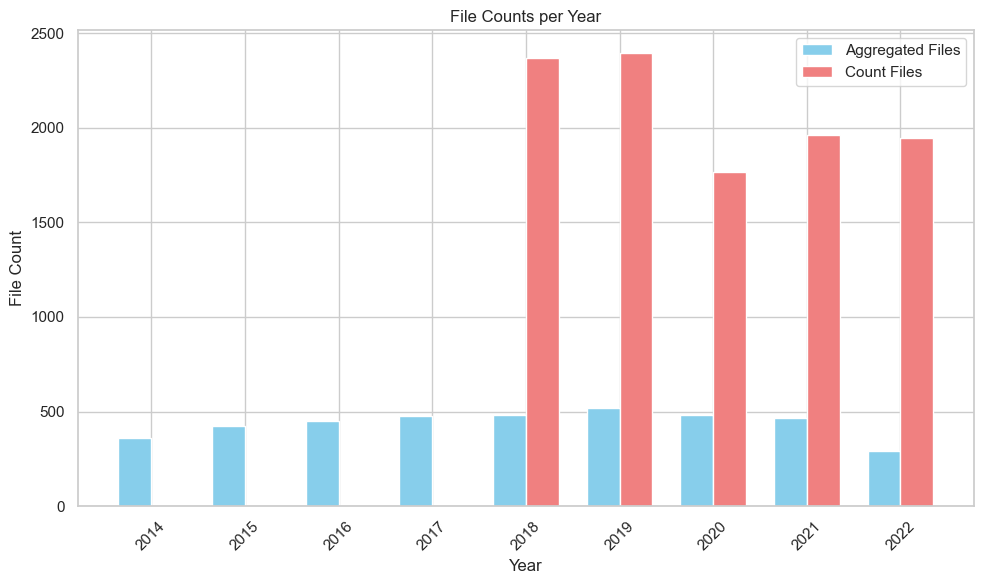

In [68]:
# Extract years and corresponding counts
years = sorted(set(aggregated_files_per_year.keys()) | set(count_files_per_year.keys()))
aggregated_counts = [aggregated_files_per_year.get(year, 0) for year in years]
count_counts = [count_files_per_year.get(year, 0) for year in years]
# width of the bars
bar_width = 0.35
# Generate the x-axis positions for the bars
x = np.arange(len(years))
# Create the bar plot
plt.figure(figsize=(10, 6))
plt.bar(x - bar_width/2, aggregated_counts, width=bar_width, color='skyblue', label='Aggregated Files')
plt.bar(x + bar_width/2, count_counts, width=bar_width, color='lightcoral', label='Count Files')
plt.xlabel('Year')
plt.ylabel('File Count')
plt.title('File Counts per Year')
plt.xticks(x, years, rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

#### Section 1.3.3 Analysis using the files from the folders

> histo - Historique des années antérieures (History of previous years)

> fact84 - Moyenne des débits horaires par jour de semaine par mois (Average hourly flow per weekday per month)

> horaire - Répartition horaire journalière (Daily time distribution)


In [69]:
%%capture
# Call the aggregate_filtered_data function
aggregated_data = aggregate_filtered_data(folder_path, subfolders, 'VOIE', [13], 'histo')


In [70]:

%%capture
# Create a new DataFrame with unique values based on 'SECTN' and 'ANNEE' columns
aggregated_data_filtered = aggregated_data.drop_duplicates(subset=['SECTN', 'ANNEE'], keep='first')
# Calculate the average of 'DJMA', 'DJME', and 'DJMH' for all years
averages = aggregated_data_filtered.groupby('ANNEE')[['DJMA', 'DJME', 'DJMH']].mean()


##### Section Plot Average of DJMA, DJME and DJMH per year

Data from the histo tab in the spreadsheets of the aggregated data. 

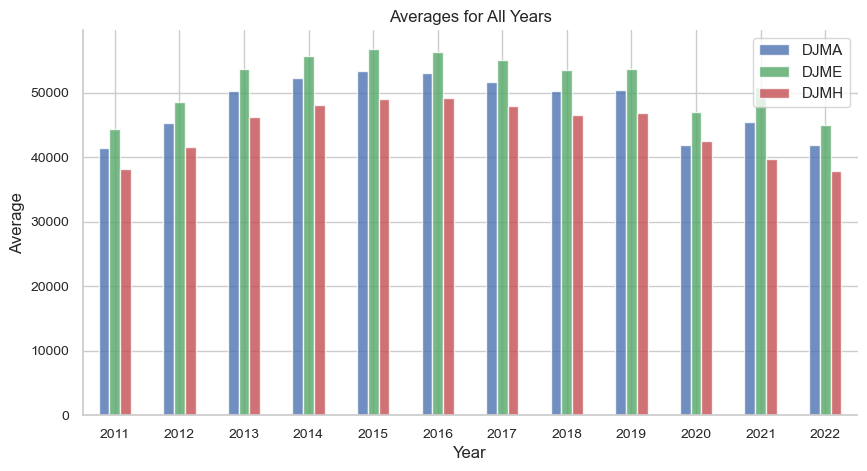

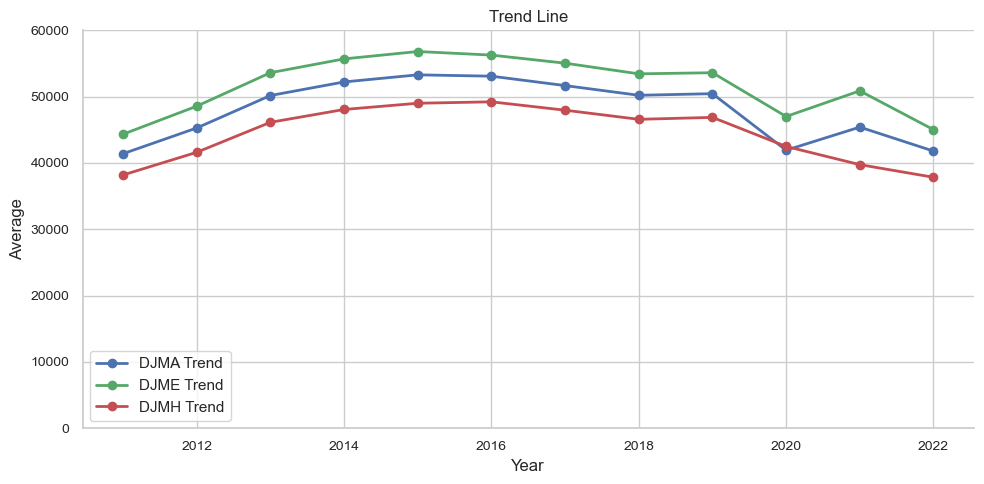

In [71]:
# Set seaborn style
sns.set(style='whitegrid')

# Create a figure and axis objects for the bar plot
fig, ax = plt.subplots(figsize=(10, 5))

# Plot the bar chart
averages.plot(kind='bar', ax=ax, color=['#4C72B0', '#55A868', '#C44E52'], alpha=0.8)

# Set the title and axis labels for the bar plot
ax.set_title('Averages for All Years', fontsize=12)
ax.set_xlabel('Year', fontsize=12)
ax.set_ylabel('Average', fontsize=12)

# Customize tick labels for the bar plot
ax.tick_params(axis='x', labelrotation=0, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

# Remove the top and right spines for the bar plot
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Create a new figure and axis objects for the line plot
fig2, ax2 = plt.subplots(figsize=(10, 5))

# Plot the trend lines
averages['DJMA'].plot(ax=ax2, color='#4C72B0', linewidth=2, marker='o', markersize=6, label='DJMA Trend')
averages['DJME'].plot(ax=ax2, color='#55A868', linewidth=2, marker='o', markersize=6, label='DJME Trend')
averages['DJMH'].plot(ax=ax2, color='#C44E52', linewidth=2, marker='o', markersize=6, label='DJMH Trend')

# Set the title and axis labels for the line plot
ax2.set_title('Trend Line', fontsize=12)
ax2.set_xlabel('Year', fontsize=12)
ax2.set_ylabel('Average', fontsize=12)

# Customize tick labels for the line plot
ax2.tick_params(axis='x', labelrotation=0, labelsize=10)
ax2.tick_params(axis='y', labelsize=10)

# Remove the top and right spines for the line plot
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

ax2.set_ylim(0, 60000)

# Show the legend for the line plot
ax2.legend()

# Show the plots
plt.tight_layout()
plt.show()

##### Analysis for the fact84 tab in the spreadsheets

> aggregated_data dataframe for the fact84

In [72]:
%%capture
# fact84 tab analysis
# Call the aggregate_filtered_data function
aggregated_data_fact84 = aggregate_filtered_data(folder_path, subfolders, 'VOIE', [13], 'fact84')

Avarages dataframe grouped by year and month 

> Function section

In [73]:
# Define a custom aggregation function that handles missing values (for some values)

# Group by 'ANNEE' and 'MOIS' columns and apply custom aggregation function to all day columns
averages_fact84 = aggregated_data_fact84.groupby(['ANNEE', 'MOIS']).agg({
    'DIMANCHE': custom_mean,
    'LUNDI': custom_mean,
    'MARDI': custom_mean,
    'MERCREDI': custom_mean,
    'JEUDI': custom_mean,
    'VENDREDI': custom_mean,
    'SAMEDI': custom_mean,
    'MOYEN': custom_mean
})
# Extract 'ANNEE' and 'MOIS' from the index and add them as columns
averages_fact84.reset_index(inplace=True)

# Define the desired order of months
month_order = ['Janvier', 'Février', 'Mars', 'Avril', 'Mai', 'Juin', 'Juillet', 'Août', 'Septembre', 'Octobre', 'Novembre', 'Décembre']

# Convert the 'MOIS' column to the ordered categorical data type
averages_fact84['MOIS'] = pd.Categorical(averages_fact84['MOIS'], categories=month_order, ordered=True)

# Sort the DataFrame by the 'MOIS' column
averages_fact84 = averages_fact84.sort_values('MOIS')


> Average hourly flow per weekday per month. Comparing separately per day the trend of the annual curves.

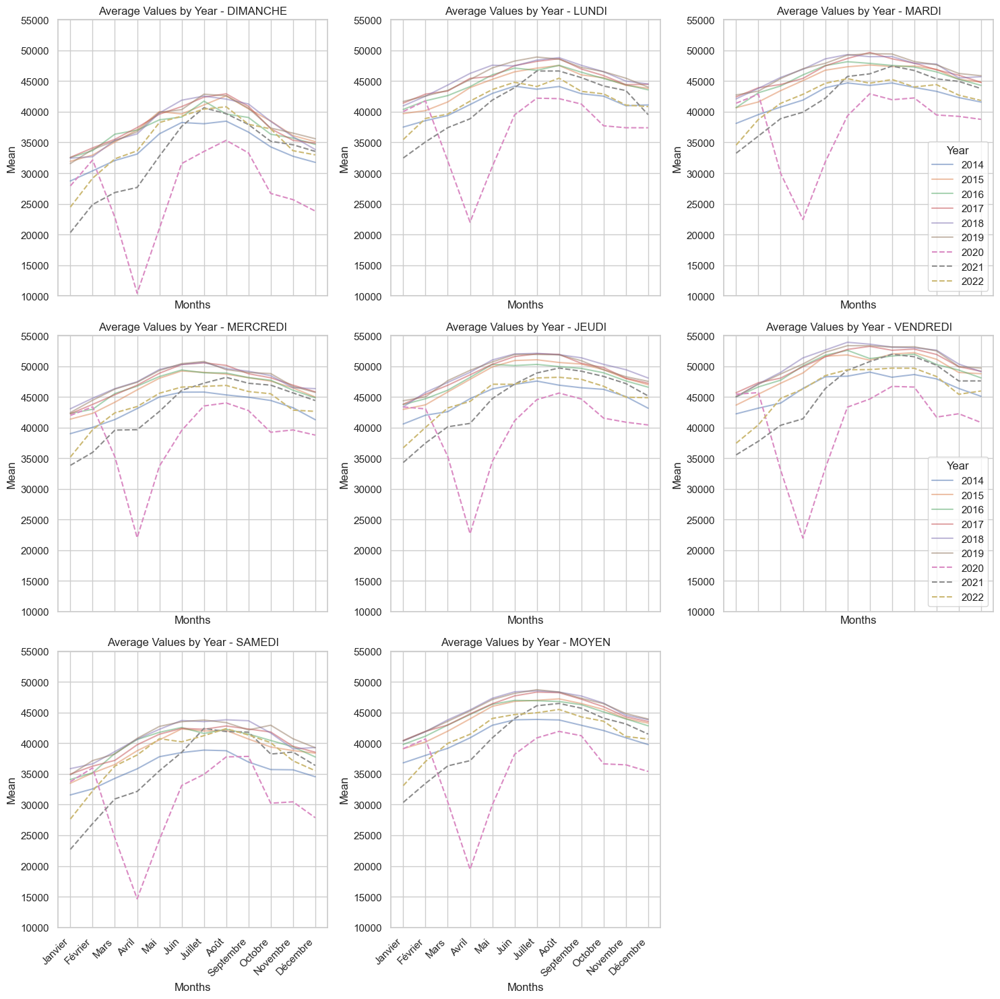

In [74]:
# Pivot the data to have days as columns and months as index
pivot_table = averages_fact84.pivot(index='MOIS', columns='ANNEE')

# Define the desired order of months
month_order = ['Janvier', 'Février', 'Mars', 'Avril', 'Mai', 'Juin', 'Juillet', 'Août', 'Septembre', 'Octobre', 'Novembre', 'Décembre']

# Reorder the pivot table based on the month order
pivot_table = pivot_table.reindex(month_order)

# Get the unique years in the data
years = pivot_table.columns.get_level_values('ANNEE').unique()

# Calculate the number of subplots
num_plots = len(pivot_table.columns.get_level_values(0).unique())
num_rows = (num_plots - 1) // 3 + 1

# Create the grid of subplots
fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows), sharex=True)

# Flatten the axes array
axes = axes.flatten()

# Define line styles for highlighting
highlight_styles = ['--', '--', '--']

# set the range
y_min = 10000
y_max = 55000

# Plot a single curve per year for each day
for i, day in enumerate(pivot_table.columns.get_level_values(0).unique()):
    ax = axes[i]
    ax.set_ylim(y_min, y_max)
    for j, year in enumerate(years):
        line_style = highlight_styles[j % len(highlight_styles)] if year in [2020, 2021, 2022] else '-'
        line_alpha = 1.0 if year in [2020, 2021, 2022] else 0.5
        line_width = 2 if year in [2020, 2021, 2022] else 1
        ax.plot(pivot_table.index, pivot_table[(day, year)], label=f'{year}', linestyle=line_style, alpha=line_alpha)
    ax.set_ylabel('Mean')
    ax.set_title(f'Average Values by Year - {day}')
    ax.set_xticks(range(len(pivot_table.index)))  # Set x-ticks
    ax.set_xticklabels(pivot_table.index, rotation=45, ha='right')  # Set x-tick labels

    if i == 2 or i == 5:
        ax.legend(title='Year')
    else:
        ax.legend().set_visible(False)  # Hide legend for other subplots

    # Show x-axis labels for all subplots
    ax.set_xlabel('Months')

# Hide unused subplots
for j in range(num_plots, num_rows * 3):
    fig.delaxes(axes[j])

# Adjust the spacing between subplots
fig.tight_layout()

# Display the plots
plt.show()




Dimanche - Sunday;

Lundi - Monday;

Mardi - Tuesday;

Mercredi - Wednesday;

Jeudi - Thursday;

Vendredi - Friday;

Samedi - Saturday;

Moyen - Average


Mean of the days per month

> The 2 plots below are the same, but one is doing the mean calculation per day, and the other is using the column "MOYEN" which is the mean. just to confirm if it is correct or not the procedure. 

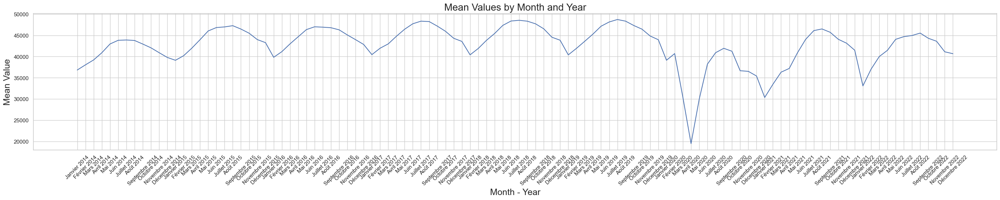

In [75]:
# Define the order of months
month_order = ['Janvier', 'Février', 'Mars', 'Avril', 'Mai', 'Juin', 'Juillet', 'Août', 'Septembre', 'Octobre', 'Novembre', 'Décembre']

# Create empty lists for x-axis labels and y-values
x_labels = []
y_values = []

# Iterate over each year and month
for year in range(2014, 2023):
    for month in month_order:
        data = averages_fact84[(averages_fact84['MOIS'] == month) & (averages_fact84['ANNEE'] == year)]
        if not data.empty:
            x_labels.append(f"{month} {year}")
            y_values.append(data[['DIMANCHE', 'LUNDI', 'MARDI', 'MERCREDI', 'JEUDI', 'VENDREDI', 'SAMEDI']].values[0].mean())

# Increase the figure size
plt.figure(figsize=(35, 5))
# Create the plot
plt.plot(x_labels, y_values)

# Set the x-axis label and ticks
plt.xlabel('Month - Year', fontsize = 18)
plt.xticks(rotation=45)

# Set the y-axis label
plt.ylabel('Mean Value', fontsize = 18)

# Set the title of the plot
plt.title('Mean Values by Month and Year', fontsize = 20)

# Display the plot
plt.show()





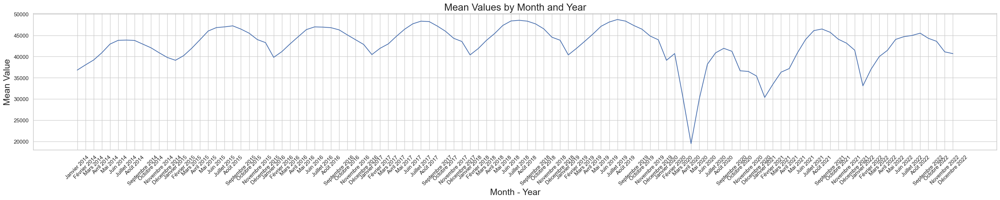

In [76]:
# Get the unique years from the data
years = averages_fact84['ANNEE'].unique()

# Sort the years in ascending order
years = sorted(years)

# Define the order of months
month_order = ['Janvier', 'Février', 'Mars', 'Avril', 'Mai', 'Juin', 'Juillet', 'Août', 'Septembre', 'Octobre', 'Novembre', 'Décembre']

# Create empty lists for x-axis labels and y-values
x_labels = []
y_values = []

# Iterate over each year and month
for year in years:
    for month in month_order:
        x_labels.append(f"{month} {year}")
        data = averages_fact84[(averages_fact84['MOIS'] == month) & (averages_fact84['ANNEE'] == year)]
        if not data.empty:
            y_values.append(data['MOYEN'].values[0])
        else:
            y_values.append(None)

# Increase the figure size
plt.figure(figsize=(35, 5))

# Create the plot
plt.plot(x_labels, y_values)

# Set the x-axis label and ticks
plt.xlabel('Month - Year', fontsize = 18)
plt.xticks(rotation=45)

# Set the y-axis label
plt.ylabel('Mean Value', fontsize = 18)

# Set the title of the plot
plt.title('Mean Values by Month and Year', fontsize = 20)

# Display the plot
plt.show()

##### Analysis for the horaire tab in the spreadsheets

> aggregated_data dataframe for the horaire data

> 2020 up to 2022 are highlighted

In [77]:
%%capture
# fact84 tab analysis
# Call the aggregate_filtered_data function
aggregated_data_hour = aggregate_filtered_data(folder_path, subfolders, 'VOIE', [13], 'horaire') # 13 it is the total of the 2 directions

In [78]:
# Group by 'ANNEE' and 'HRE' columns and apply custom aggregation function to all day columns
averages_horaire = aggregated_data_hour.groupby(['ANNEE', 'HRE']).agg({
    'DIMANCHE': custom_mean,
    'SAMEDI': custom_mean,
    'OUVRABLE': custom_mean,
})

# Extract 'ANNEE' and 'MOIS' from the index and add them as columns
averages_horaire.reset_index(inplace=True)


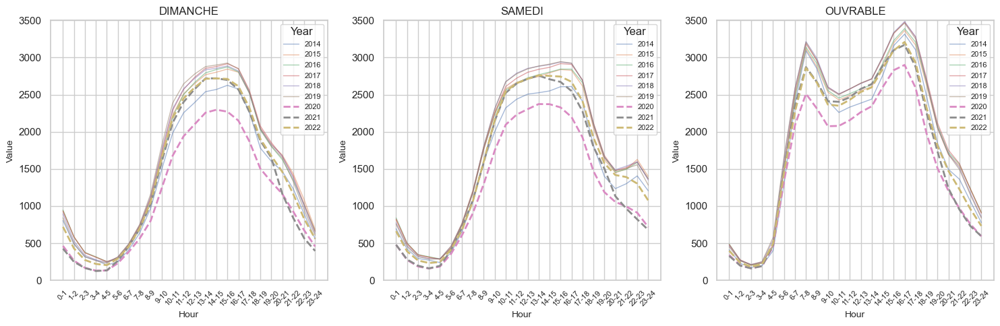

In [231]:
# Define the custom order of hours
hour_order = ['0-1', '1-2', '2-3', '3-4', '4-5', '5-6', '6-7', '7-8', '8-9', '9-10', '10-11', '11-12',
              '12-13', '13-14', '14-15', '15-16', '16-17', '17-18', '18-19', '19-20', '20-21', '21-22', '22-23', '23-24']

# Filter the dataframe to include only relevant columns
df_filtered = averages_horaire[averages_horaire['HRE'] != 'Total']

# Get unique days
days = ['DIMANCHE', 'SAMEDI', 'OUVRABLE']

# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=len(days), figsize=(15, 5))

# Iterate over each day and create a subplot
for i, day in enumerate(days):
    ax = axes[i]
    
    # Filter data for the current day
    data = df_filtered[df_filtered[day].notnull()]
    
    # Convert 'HRE' column to ordered categorical data
    data['HRE'] = pd.Categorical(data['HRE'], categories=hour_order, ordered=True)
    data = data.sort_values('HRE')
    
    # Iterate over years
    for year in sorted(data['ANNEE'].unique()):
        # Filter data for the current year
        year_data = data[data['ANNEE'] == year]
        
        # Get hours and values for the current year and day
        hours = year_data['HRE']
        values = year_data[day]
        
        # Set line style and color for specific years
        if year in [2020, 2021, 2022]:
            line_style = '--'
            line_width = 2
            line_alpha = 1.0
        else:
            line_style = '-'
            line_width = 1
            line_alpha = 0.5
        
        # Plot the curve with standard deviation as shaded region
        sns.lineplot(x=hours, y=values, ax=ax, label=str(year), linestyle=line_style,
                     linewidth=line_width, alpha=line_alpha, errorbar='sd')
    
    # Set subplot title and labels
    ax.set_title(day, fontsize=12)
    ax.set_xlabel('Hour', fontsize=10)
    ax.set_ylabel('Value', fontsize=10)
    ax.legend(title='Year', fontsize=8)
    ax.tick_params(axis='x', labelrotation=45, labelsize=8)
    ax.set_ylim(0, 3500)  # y-axis range

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()

## Section 2 - Geoanalysis and more
[Return](#section-2-aggregated-files-and-count-files-analysis)

In [80]:
%%capture
import os
import geopandas as gpd

# Specify the folder path
folder_path = 'debit_circulation_quebec2'

# Get the list of subfolders
subfolders = next(os.walk(folder_path))[1]

# Load the shapefile
shapefile_path = 'cir_v_geo_sectn_trafc_locls/cir_v_geo_sectn_trafc_locls.shp'
gdf = gpd.read_file(shapefile_path)

# Get the unique values in the "num_sectn_" column
shapefile_subfolders = gdf['num_sectn_'].unique()

# Compare the subfolders with the shapefile subfolders
matching_subfolders = set(subfolders) & set(shapefile_subfolders)
non_matching_subfolders = set(subfolders) - set(shapefile_subfolders)

# Print the matching subfolders
print("Matching Subfolders:")
for subfolder in matching_subfolders:
    print(subfolder)

# Print the non-matching subfolders
print("Non-matching Subfolders:")
for subfolder in non_matching_subfolders:
    print(subfolder)



In [81]:
# Count the matching subfolders
matching_count = len(set(subfolders) & set(shapefile_subfolders))

# Print the count of matching subfolders
print(f"Number of Matching Subfolders: {matching_count}")

# Find the non-matching subfolders
non_matching_subfolders = set(subfolders) - set(shapefile_subfolders)

# Count the non-matching subfolders
non_matching_count = len(non_matching_subfolders)

# Print the count of non-matching subfolders
print(f"Number of Non-Matching Subfolders: {non_matching_count}")

Number of Matching Subfolders: 4888
Number of Non-Matching Subfolders: 0


> We don't have non-matching subfolders!

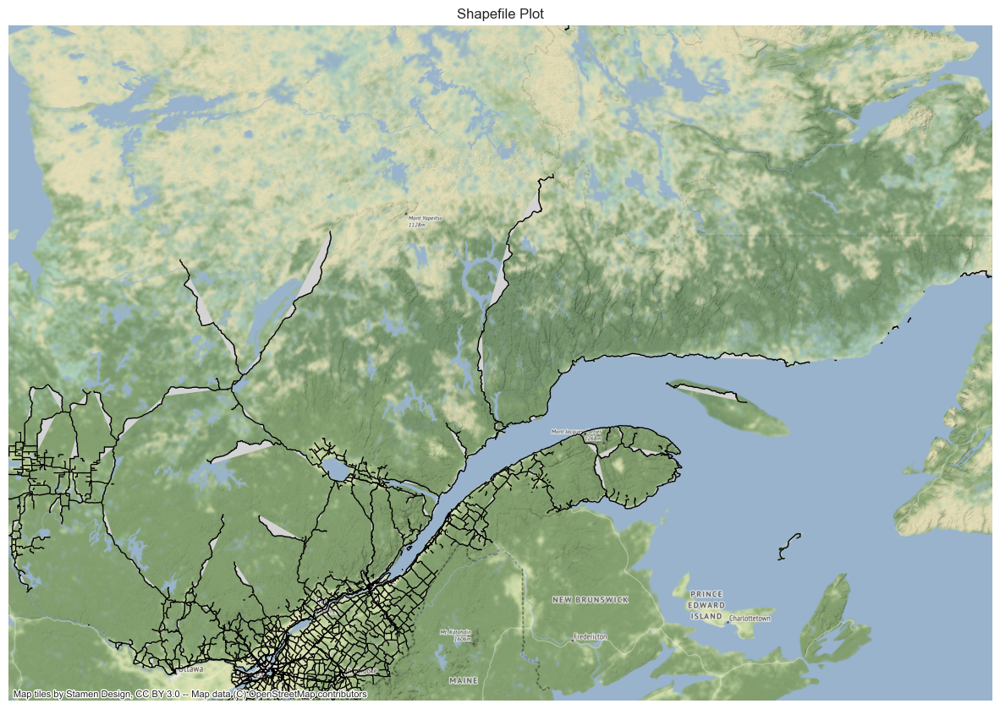

In [82]:
import contextily as ctx

# Create the plot
fig, ax = plt.subplots(figsize=(15, 20))

# Plot the shapefile
gdf.plot(ax=ax, facecolor='lightgray', edgecolor='black', linewidth=1)

# Add basemap
ctx.add_basemap(ax, crs=gdf.crs.to_string())

# Set the aspect ratio
ax.set_aspect('equal')

# Set the axis limits to center the plot
x_min, x_max = gdf.total_bounds[0], gdf.total_bounds[2]
y_min, y_max = gdf.total_bounds[1], gdf.total_bounds[3]
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

# Remove axis labels
ax.set_axis_off()

# Add title
ax.set_title('Shapefile Plot')

# Show the plot
plt.show()



#### Evolution of data collection points over the years.


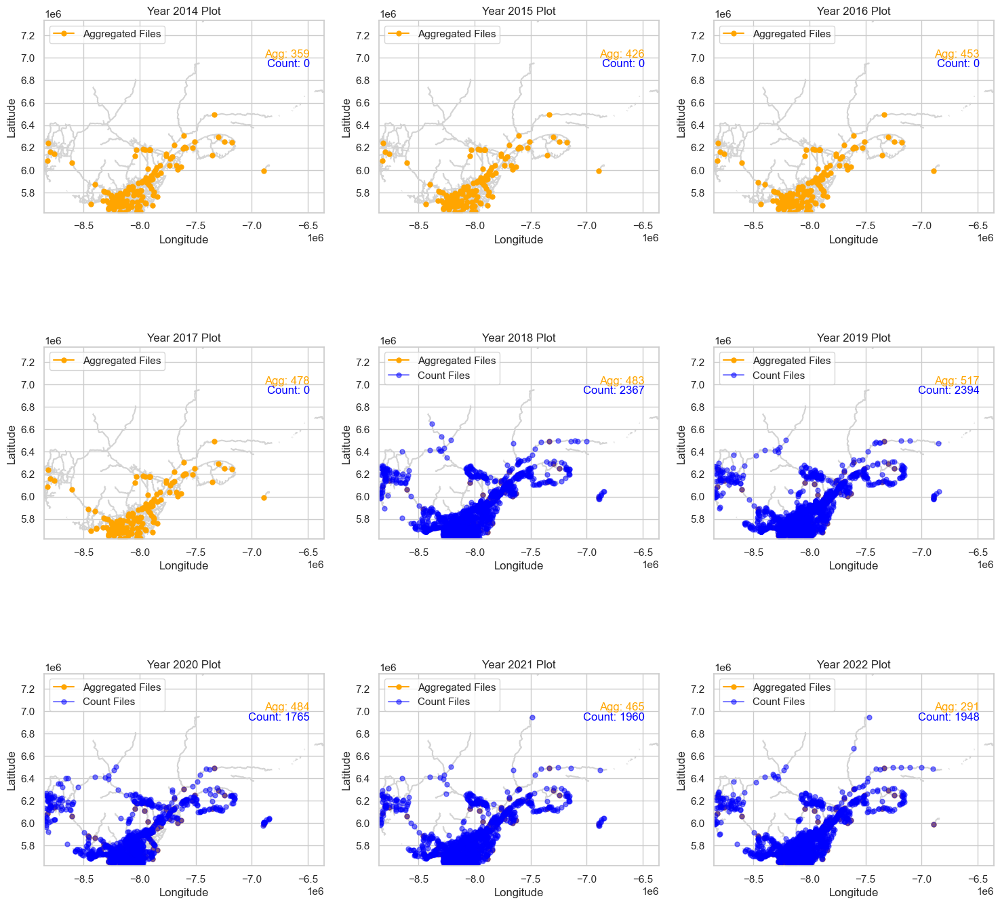

In [83]:
# Initialize the grid of plots
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 15))
axes = axes.flatten()

# Iterate over the years
for i, year in enumerate(range(2014, 2023)):
    # Create a new axis for each year
    ax = axes[i]
    
    # Plot the shapefile
    gdf.plot(ax=ax, color='lightgray', edgecolor='black')
    
    # Initialize label variables for legend
    agg_label = None
    count_label = None
    
    # Initialize count variables for aggregated and count files
    count_agg = 0
    count_count = 0
    
    # Iterate over the matching subfolders for aggregated files
    for subfolder in subfolders:
        # Get the list of files in the subfolder
        files = os.listdir(os.path.join(folder_path, subfolder))
        
        # Check if it's an aggregated file for the current year
        if any(file.startswith(subfolder) and f'_{year}.' in file for file in files):
            # Plot aggregated files in orange and update the label
            ax.plot(
                gdf[gdf['num_sectn_'] == subfolder].geometry.centroid.x,
                gdf[gdf['num_sectn_'] == subfolder].geometry.centroid.y,
                marker='o', color='orange', markersize=5, label='Aggregated Files' if not agg_label else ''
            )
            agg_label = True
            # Increment count for aggregated files
            count_agg += gdf[gdf['num_sectn_'] == subfolder].shape[0]
            
    # Iterate over the matching subfolders for count files
    for subfolder in matching_subfolders:
        # Get the list of files in the subfolder
        files = os.listdir(os.path.join(folder_path, subfolder))
        
        # Check if it's a count file for the current year
        if any(f'-{year}-' in file and 'donnees' in file for file in files):
            # Plot count files in blue and update the label
            ax.plot(
                gdf[gdf['num_sectn_'] == subfolder].geometry.centroid.x,
                gdf[gdf['num_sectn_'] == subfolder].geometry.centroid.y,
                marker='o', color='blue', markersize=5, alpha=0.5, label='Count Files' if not count_label else ''
            )
            count_label = True
            # Increment count for count files
            count_count += gdf[gdf['num_sectn_'] == subfolder].shape[0]
    
    # Set the aspect ratio
    ax.set_aspect('equal')
    
    # Set the axis limits to center the plot
    x_min, x_max = gdf.total_bounds[0], gdf.total_bounds[2]
    y_min, y_max = gdf.total_bounds[1], gdf.total_bounds[3]
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    
    # Add title and labels
    ax.set_title(f'Year {year} Plot')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    
    # Set the legends for each color in each map
    ax.legend(loc='upper right')  # For Aggregated Files
    ax.legend(loc='upper left')   # For Count Files
    
    # Display the point counts as annotations
    ax.text(0.95, 0.85, f'Agg: {count_agg}', transform=ax.transAxes, ha='right', va='top', color='orange')
    ax.text(0.95, 0.8, f'Count: {count_count}', transform=ax.transAxes, ha='right', va='top', color='blue')

# Hide unused subplots
for j in range(len(matching_subfolders), len(axes)):
    fig.delaxes(axes[j])

# Adjust the spacing between subplots
fig.tight_layout()

# Show the plot
plt.show()

### construction of a csv file given the type of each segment (type of the route)



In [84]:
# creating a function to interate in the subfolders files. similar of the aggregated_filtered_data function. To filter a value in a column or just a column
import os
import pandas as pd

def read_count_file(folder_path, subfolders, include_entete=False):
    count_data_list = []

    for subfolder in subfolders:
        # Get the list of files in the subfolder
        files = os.listdir(os.path.join(folder_path, subfolder))

        for file in files:
            # Check if it's a count file
            if file.startswith(subfolder) and '-' in file and 'donnees' in file:
                filepath = os.path.join(folder_path, subfolder, file)
                try:
                    # Read the Excel file
                    xls = pd.ExcelFile(filepath)
                    sheet_names = xls.sheet_names

                    # Determine which sheet to read based on include_entete
                    sheet_index = 0 if include_entete else 1
                    count_df = pd.read_excel(xls, sheet_names[sheet_index], header=0)
                    count_data_list.append(count_df)
                except:
                    print(f"Error reading {file}")

    if count_data_list:
        count_data = pd.concat(count_data_list, ignore_index=True)
        return count_data
    else:
        return None

def count_filtered_data(folder_path, subfolders, filter_column, filter_values, sheet_name):
    # Initialize a list to store all filtered DataFrames
    count_data_list = []

    # Iterate over subfolders
    for subfolder in subfolders:
        # Get the list of files in the subfolder
        files = os.listdir(os.path.join(folder_path, subfolder))

        # Iterate over files in the subfolder
        for file in files:
            # Check if it's a count file
            if file.startswith(subfolder) and '-' in file and 'donnees' in file:
                # Read the Excel file
                filepath = os.path.join(folder_path, subfolder, file)
                
                # Read the specified sheet with filter on the specified column
                filtered_df = read_filtered_excel(filepath, sheet_name, filter_column, filter_values)
                
                if filtered_df is not None:
                    # Append filtered data to the count_data_list
                    count_data_list.append(filtered_df)

    # Concatenate the list of DataFrames into a single DataFrame
    count_data = pd.concat(count_data_list, ignore_index=True)

    return count_data



In [85]:
%%capture
#  _9999999999_9999_entete tab in the spreadsheet analysis (see the dictionary of the data) - pdf file
# Call the count_all_data_column function
section_type = read_count_file(folder_path, subfolders, include_entete=True)

In [86]:
# Keep only the first 10 columns (the others columns are the second sheet)
section_type = section_type.iloc[:, :9]

# Drop duplicates from the 'section' column
section_type = section_type.drop_duplicates(subset=['section'])

# Drop rows with NaN values in the 'section' column
section_type = section_type.dropna(subset=['section'])

# Save the modified DataFrame as a CSV file
section_type.to_csv('section_type.csv', index=False)



### CALCULATED DJMA AND ANALYSIS OF THE TOP 10

In [87]:
%%capture
# fact84 tab analysis
# Call the aggregate_filtered_data function
aggregated_data_djmm = aggregate_filtered_data(folder_path, subfolders, 'VOIE', [13], 'djmm')

In [205]:
# Filter data for the year 2018
filtered_data_2018 = aggregated_data_djmm[aggregated_data_djmm['ANNEE'] == 2018]

# Group by 'SECTN' and 'ANNEE', calculate DJMA, and sum TOT_MOIS
grouped_data = filtered_data_2018.groupby(['SECTN', 'ANNEE'])['TOT_MOIS'].sum() / 365

# Reset the index to make SECTN and ANNEE columns again
grouped_data = grouped_data.reset_index()

# Sort by DJMA in descending order and get the top 10 sections
top_10_sections = grouped_data.sort_values(by='TOT_MOIS', ascending=False).head(10)

# Rename the 'TOT_MOIS' column to 'DJMA'
top_10_sections = top_10_sections.rename(columns={'TOT_MOIS': 'DJMA'})

# Print the top 10 sections with the largest DJMA in 2018
print(top_10_sections)
print(grouped_data.head())


        SECTN  ANNEE           DJMA
17    1519000   2018  176126.027397
241  44017500   2018   170227.39726
94    4013935   2018  167561.643836
95    4013940   2018  161890.410959
60    2514000   2018  158643.835616
9     1305000   2018   154972.60274
19    1522200   2018  154726.027397
90    4013860   2018  154216.438356
93    4013930   2018  151975.342466
39    2014100   2018  150068.493151
     SECTN  ANNEE      TOT_MOIS
0  1012500   2018   83027.39726
1  1015500   2018  39616.438356
2  1023500   2018   33186.30137
3  1301500   2018  79276.712329
4  1301800   2018  85446.575342


In [89]:
# creating a function to interate in the subfolders files. similar of the aggregated_filtered_data function. To filter a value in a column or just a column
import os
import pandas as pd

def read_count_file(folder_path, subfolders, include_entete=False):
    count_data_list = []

    for subfolder in subfolders:
        # Get the list of files in the subfolder
        files = os.listdir(os.path.join(folder_path, subfolder))

        for file in files:
            # Check if it's a count file
            if file.startswith(subfolder) and '-' in file and 'donnees' in file:
                filepath = os.path.join(folder_path, subfolder, file)
                try:
                    # Read the Excel file
                    xls = pd.ExcelFile(filepath)
                    sheet_names = xls.sheet_names

                    # Determine which sheet to read based on include_entete
                    sheet_index = 0 if include_entete else 1
                    count_df = pd.read_excel(xls, sheet_names[sheet_index], header=0)
                    count_data_list.append(count_df)
                except:
                    print(f"Error reading {file}")

    if count_data_list:
        count_data = pd.concat(count_data_list, ignore_index=True)
        return count_data
    else:
        return None


def count_filtered_data(folder_path, subfolders, filter_column, filter_values, sheet_name):
    # Initialize a list to store all filtered DataFrames
    count_data_list = []

    # Iterate over subfolders
    for subfolder in subfolders:
        # Get the list of files in the subfolder
        files = os.listdir(os.path.join(folder_path, subfolder))

        # Iterate over files in the subfolder
        for file in files:
            # Check if it's a count file
            if file.startswith(subfolder) and '-' in file and 'donnees' in file:
                # Read the Excel file
                filepath = os.path.join(folder_path, subfolder, file)
                
                # Read the specified sheet with filter on the specified column
                filtered_df = read_filtered_excel(filepath, sheet_name, filter_column, filter_values)
                
                if filtered_df is not None:
                    # Append filtered data to the count_data_list
                    count_data_list.append(filtered_df)

    # Concatenate the list of DataFrames into a single DataFrame
    count_data = pd.concat(count_data_list, ignore_index=True)

    return count_data

In [90]:
# Check the data types of the 'SECTN' column in top_10_sections
print(top_10_sections['SECTN'].dtype)

# Check the data type of the 'num_sectn_' column
data_type = gdf['num_sectn_'].dtype
print(f'Data type of num_sectn_: {data_type}')

object
Data type of num_sectn_: object


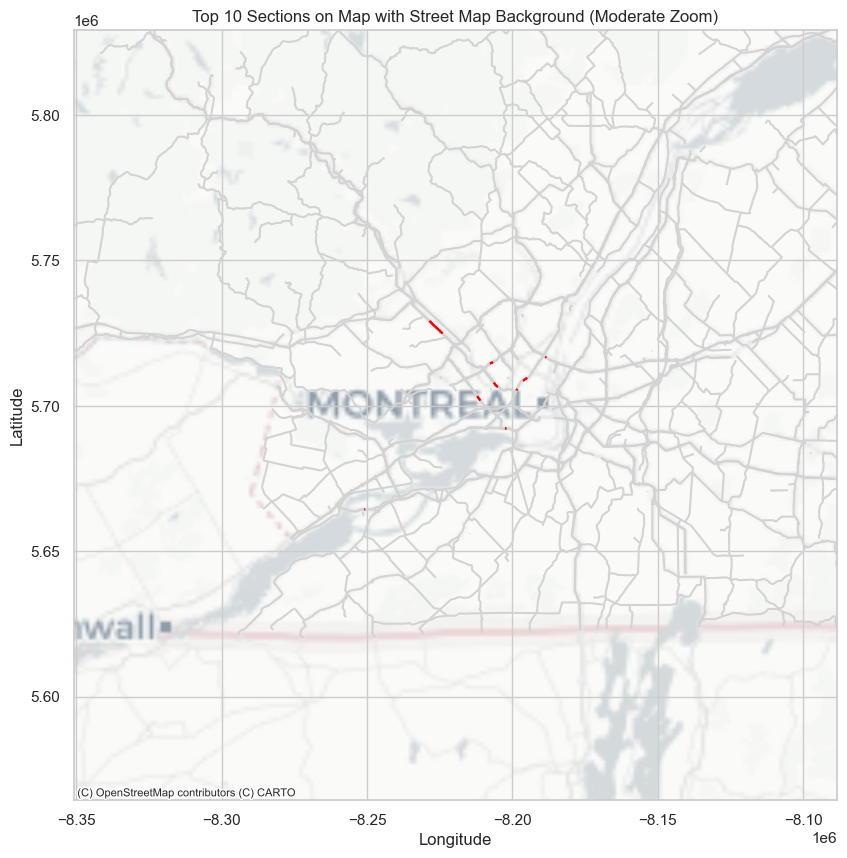

In [91]:
# Create the plot
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the shapefile
gdf.plot(ax=ax, color='lightgray', edgecolor='black')

# Add a street map as a background using CartoDB's Positron
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

# Filter the GeoDataFrame based on partial match between SECTN and num_sectn_
filtered_gdf = gdf[gdf['num_sectn_'].str.contains('|'.join(top_10_sections['SECTN'].astype(str)), case=False, na=False)]

# Plot the top 10 sections in a different color
filtered_gdf.plot(ax=ax, color='red', markersize=50)

# Set the aspect ratio
ax.set_aspect('equal')

# Adjust the axis limits for a moderate zoom
x_min, x_max = filtered_gdf.total_bounds[0] - 100000, filtered_gdf.total_bounds[2] + 100000
y_min, y_max = filtered_gdf.total_bounds[1] - 100000, filtered_gdf.total_bounds[3] + 100000
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

# Add title and labels
ax.set_title('Top 10 Sections on Map with Street Map Background (Moderate Zoom)')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plot
plt.show()




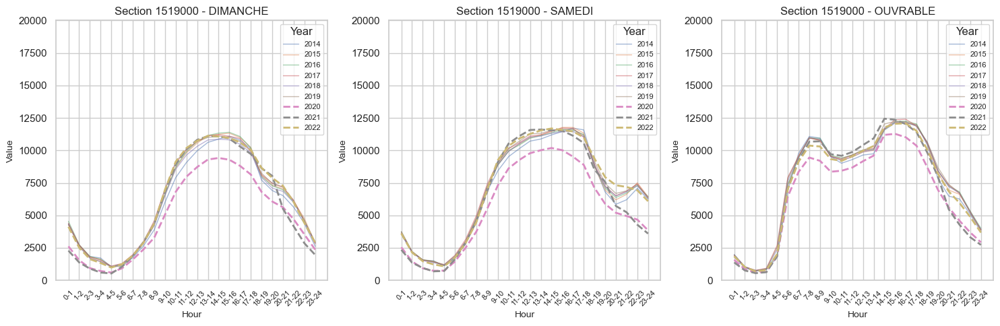

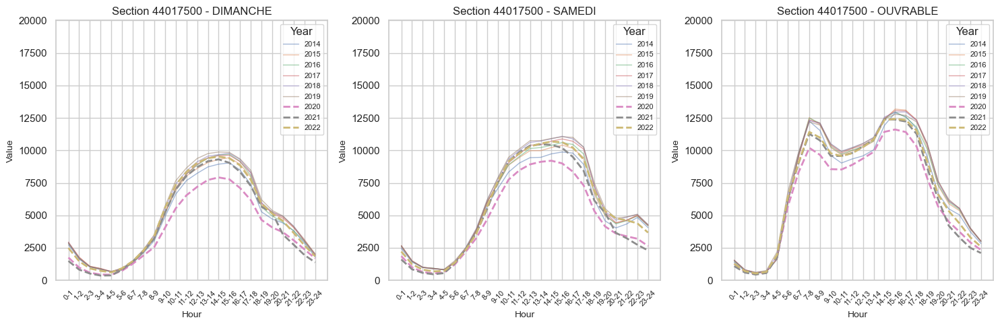

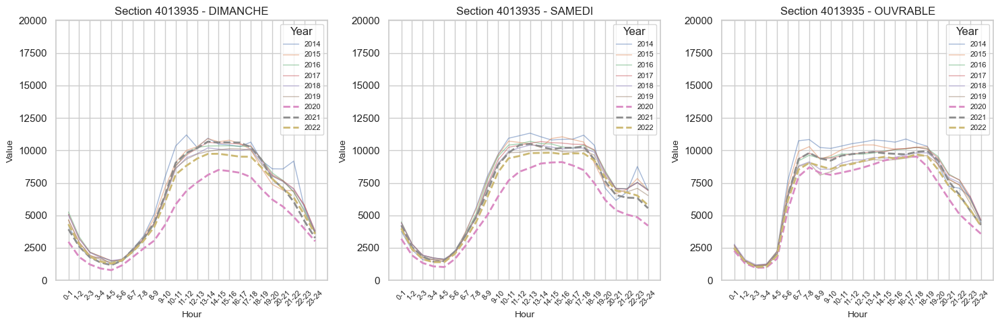

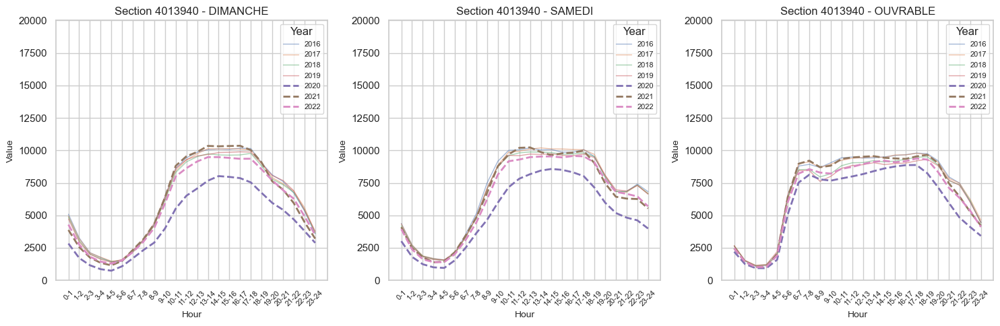

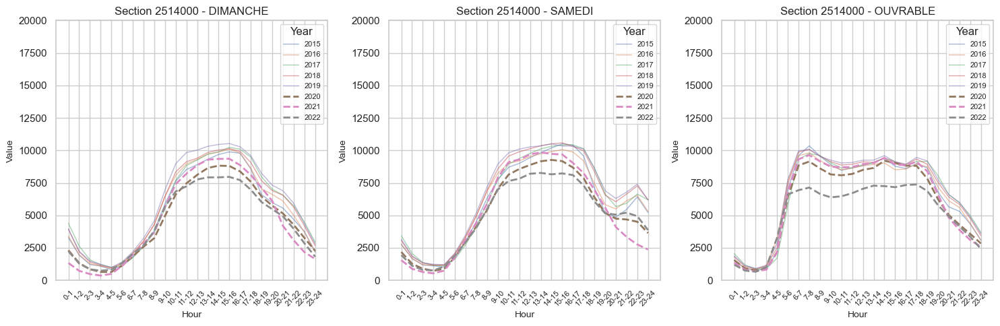

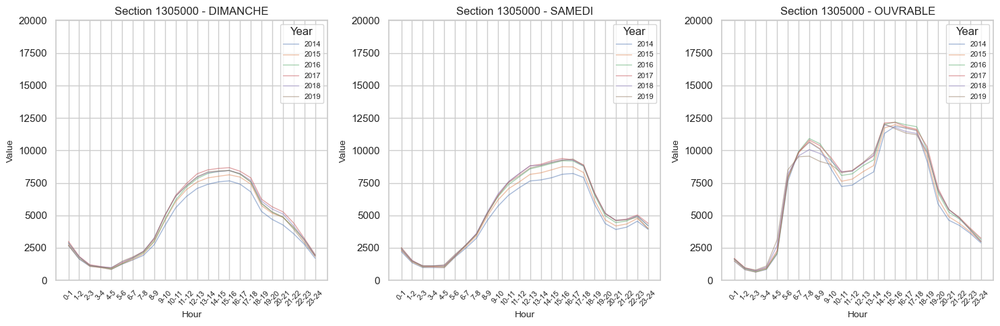

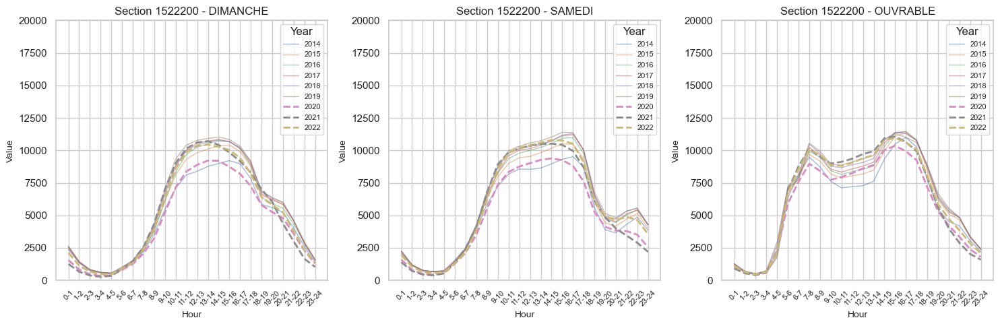

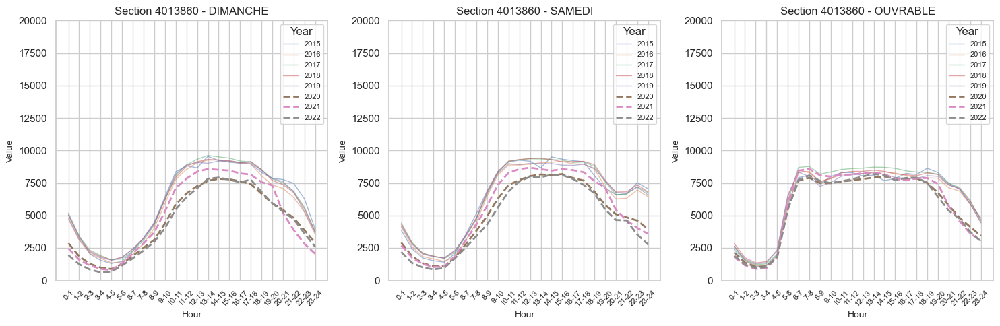

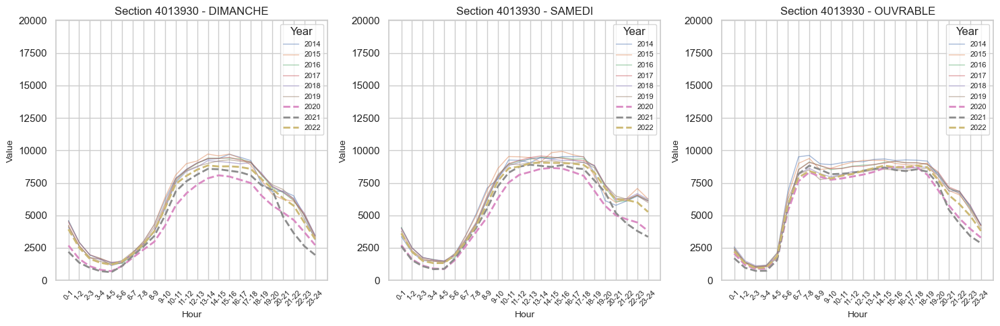

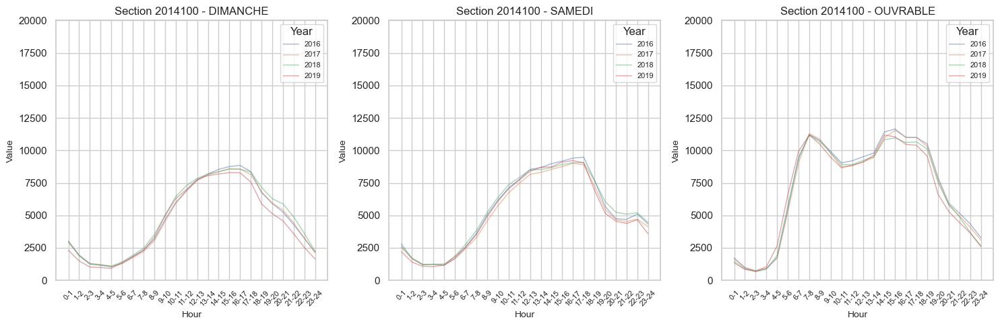

In [92]:
for section in top_10_sections['SECTN'].astype(str):
    # Create a new figure for each section
    plt.figure(figsize=(15, 5))
    
    # Iterate over each day and create a subplot
    for i, day in enumerate(days):
        ax = plt.subplot(1, len(days), i + 1)
        
        # Filter data for the current section and day from aggregated_data_hour
        data = aggregated_data_hour[(aggregated_data_hour['SECTN'].astype(str) == section) & (aggregated_data_hour[day].notnull())]
        
        # Explicitly create a copy of the DataFrame
        data = data.copy()
        
        # Convert 'HRE' column to ordered categorical data
        data['HRE'] = pd.Categorical(data['HRE'], categories=hour_order, ordered=True)
        data = data.sort_values('HRE')
        
        # Set y-axis limit to 20,000
        y_max = 20000
        
        # Iterate over years
        for year in sorted(data['ANNEE'].unique()):
            # Filter data for the current year
            year_data = data[data['ANNEE'] == year]
            
            # Get hours and values for the current year and day
            hours = year_data['HRE']
            values = year_data[day]
            
            # Set line style and color for specific years
            if year in [2020, 2021, 2022]:
                line_style = '--'
                line_width = 2
                line_alpha = 1.0
            else:
                line_style = '-'
                line_width = 1
                line_alpha = 0.5
            
            # Plot the curve
            sns.lineplot(x=hours, y=values, label=str(year), linestyle=line_style,
                         linewidth=line_width, alpha=line_alpha)
        
        # Set subplot title and labels
        plt.title(f'Section {section} - {day}', fontsize=12)
        plt.xlabel('Hour', fontsize=10)
        plt.ylabel('Value', fontsize=10)
        plt.legend(title='Year', fontsize=8)
        plt.xticks(rotation=45, fontsize=8)
        plt.ylim(0, y_max)  # Set the y-axis limit
        
    # Show and save the plot for each section
    plt.tight_layout()
    plt.show()

In [93]:
# Define a custom color palette with distinct colors for each year
year_palette = sns.color_palette("husl", n_colors=len(sorted(aggregated_data_hour['ANNEE'].unique())))
year_palette_fact84 = sns.color_palette("husl", n_colors=len(sorted(aggregated_data_fact84['ANNEE'].unique())))

# Define line styles and widths for specific years
line_styles = {2020: '--', 2021: '--', 2022: '--'}
line_widths = {2020: 2, 2021: 2, 2022: 2}

# Create a dictionary to map years to colors
year_colors = {}
for idx, year in enumerate(sorted(aggregated_data_hour['ANNEE'].unique())):
    year_colors[year] = year_palette[idx]

# Create a dictionary to map years to colors
year_colors_fact84 = {}
for idx, year in enumerate(sorted(aggregated_data_fact84['ANNEE'].unique())):
    year_colors_fact84[year] = year_palette_fact84[idx]

# Merge aggregated_data_hour with top_10_sections
merged_data = pd.merge(aggregated_data_hour, top_10_sections[['SECTN', 'DJMA']], on='SECTN')
merged_data_fact84 = pd.merge(aggregated_data_fact84, top_10_sections[['SECTN', 'DJMA']], on='SECTN')

# Create a list of unique section names
section_names = top_10_sections['SECTN'].astype(str)

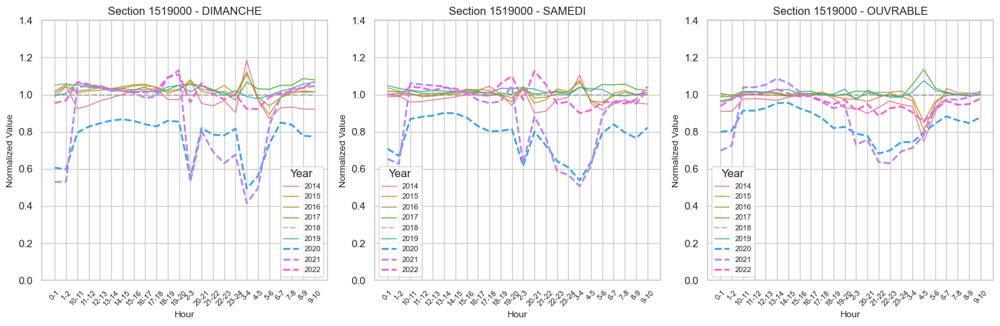

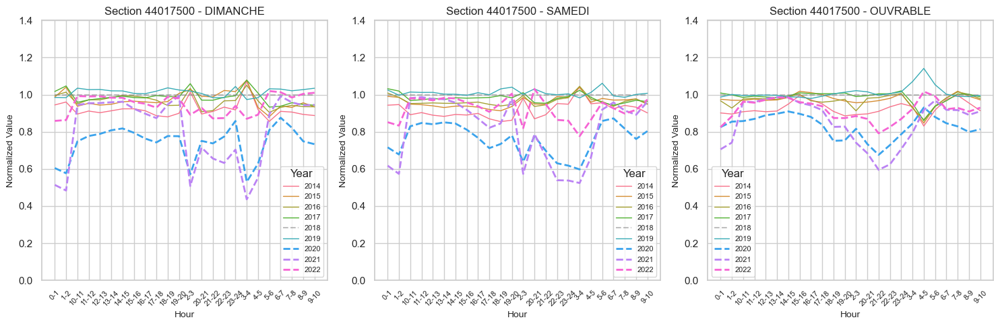

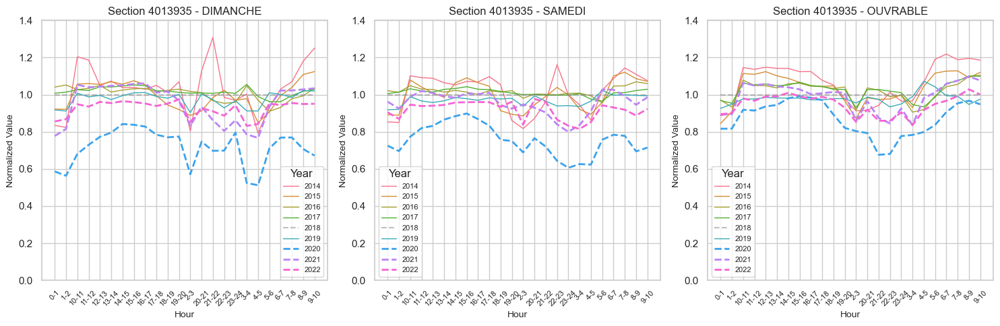

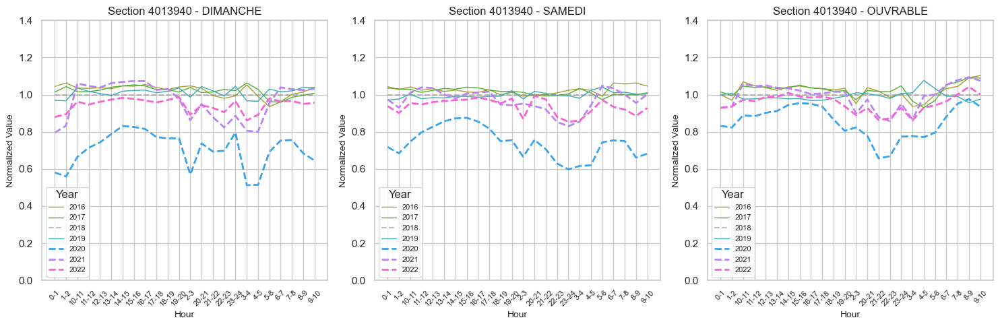

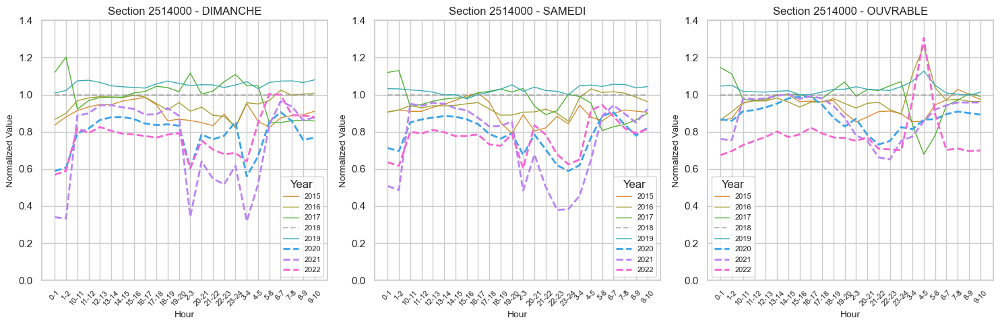

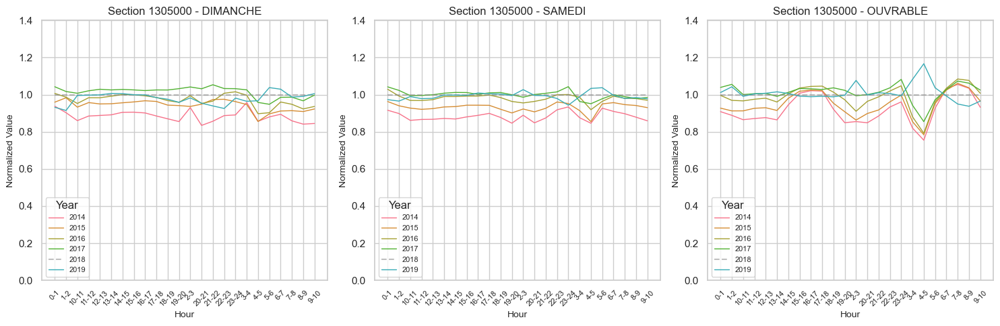

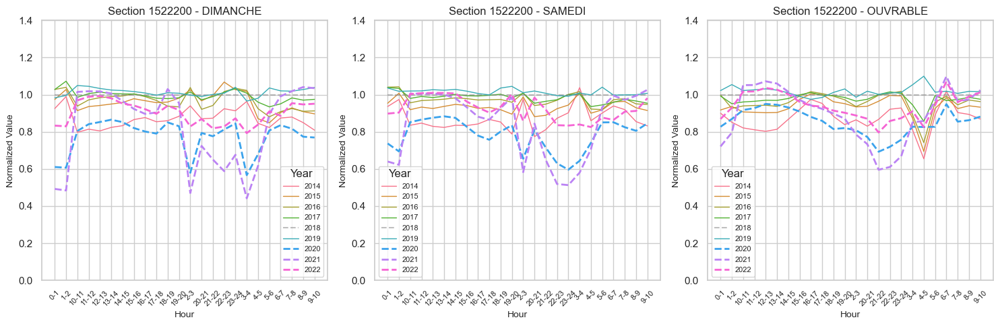

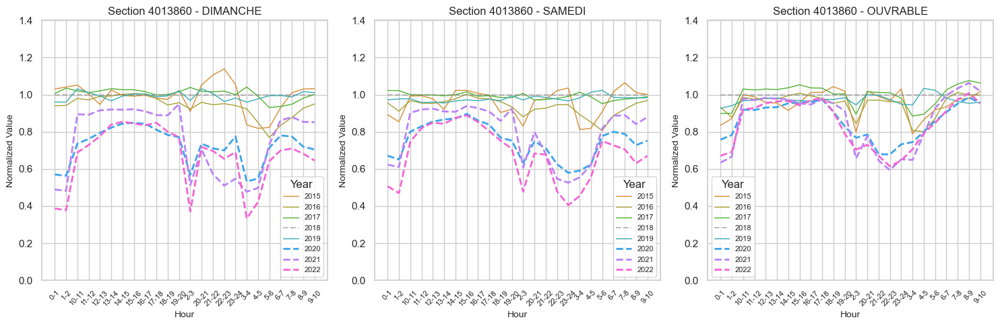

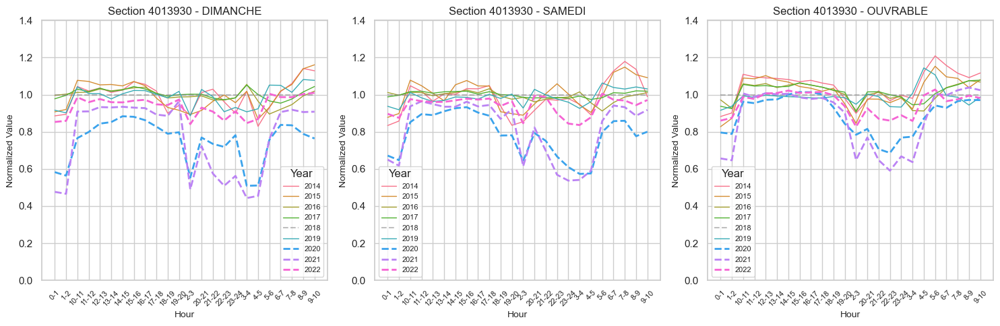

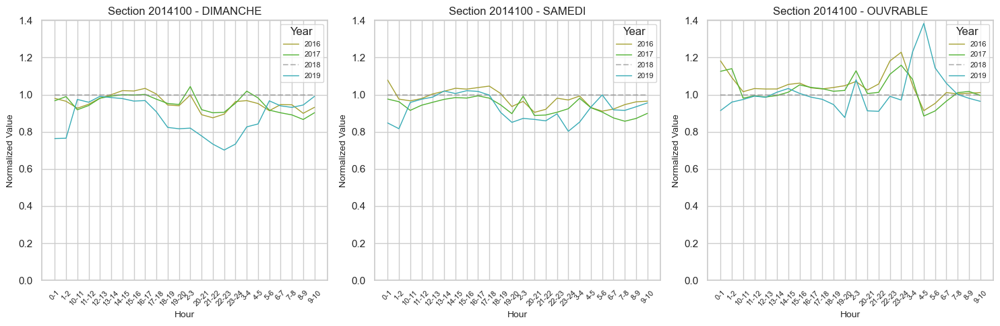

In [126]:
# Create a dictionary to map section names to colors
section_colors = {}
for idx, section in enumerate(section_names):
    section_colors[section] = year_palette[idx % len(year_palette)]

# Assuming you have already loaded aggregated_data_hour and top_10_sections

# Create a new figure for each section
for section in section_names:
    plt.figure(figsize=(15, 5))
    
    # Iterate over each day and create a subplot
    for i, day in enumerate(days):
        ax = plt.subplot(1, len(days), i + 1)
        
        # Filter data for the current section and day from aggregated_data_hour
        data = aggregated_data_hour[(aggregated_data_hour['SECTN'].astype(str) == section) & (aggregated_data_hour[day].notnull())].copy()
        
        # Convert 'HRE' column to ordered categorical data using .loc
        data.loc[:, 'HRE'] = pd.Categorical(data['HRE'], categories=hour_order, ordered=True)
        data = data.sort_values('HRE')
        
        # Set y-axis limit to 2 (can adjust as needed)
        y_max = 1.4
        
        # Check if there's data for this section and day
        if not data.empty:
            # Get data for the reference year (2018)
            ref_data = data[data['ANNEE'] == 2018]
            if not ref_data.empty:
                ref_values = ref_data[day].values

                # Iterate over years
                for year in sorted(data['ANNEE'].unique()):
                    # Filter data for the current year
                    year_data = data[data['ANNEE'] == year]

                    # Get hours and values for the current year and day
                    hours = year_data['HRE']
                    values = year_data[day] / ref_values  # Normalize by dividing by the reference year (2018) value
                    
                    # Ensure that normalized values are in the range [0, 2]
                    values = values.clip(0, 2)

                    # Set line style and color for specific years
                    color = year_colors.get(year, 'k')  # Default to black if color is not defined
                    line_style = line_styles.get(year, '-')
                    line_width = line_widths.get(year, 1)
                    line_alpha = 1.0 if year != 2018 else 0.5
                    label = str(year) if year != 2018 else "2018"
                    
                    # Highlight the year 2018 with a dark gray dotted line
                    if year == 2018:
                        color = 'gray'
                        line_style = '--'
                        line_width = 1.5  # Adjust line width as needed

                    # Plot the curve
                    sns.lineplot(x=hours, y=values, label=label, linestyle=line_style,
                                 linewidth=line_width, alpha=line_alpha, color=color)

                # Set subplot title and labels
                plt.title(f'Section {section} - {day}', fontsize=12)
                plt.xlabel('Hour', fontsize=10)
                plt.ylabel('Normalized Value', fontsize=10)
                plt.legend(title='Year', fontsize=8)
                plt.xticks(rotation=45, fontsize=8)
                plt.ylim(0, y_max)  # Set the y-axis limit
        
    # Show the plot for each section
    plt.tight_layout()
    plt.show()

### Index using the djma of reference - Year 2018 

- as-tu fait les calculs d'indice moyen par mois, jour par mois, heure selon le jour (ouvrable / fin de semaine)?
periode d'analyse par heure de la journée (selon le jour), par jour de la semaine, par mois de l'année? normalisé ou pas (par rapport au DJMA de l'année)ou analyse de croissance par rapport à un DJMA d'une année données (par ex 2018); 

- aggrégation possible (moyenne, médiane) par région et par classe de route des débits normalisés; 

- analyse d'heure et jour de pointe par semaine (mois) par an, par site / région / classe de route;

- analyse du top N (10, 20...) par semaine (mois) par an sur carte (carte de chaleur?)
possible de faire du clustering des sections avec des vecteurs des débits normalisés (heure, jour, mois) par an

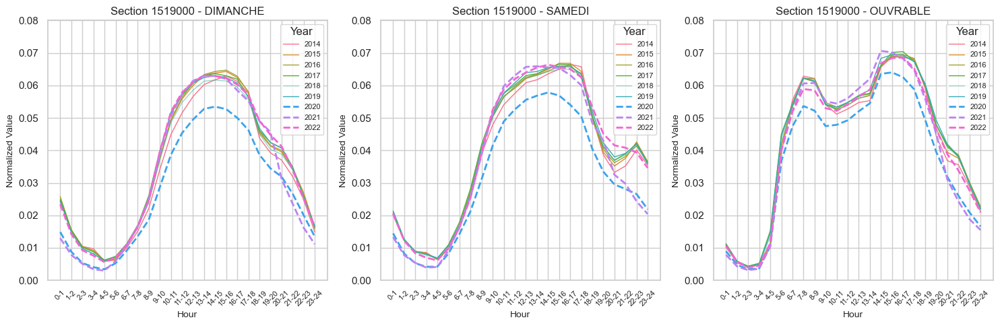

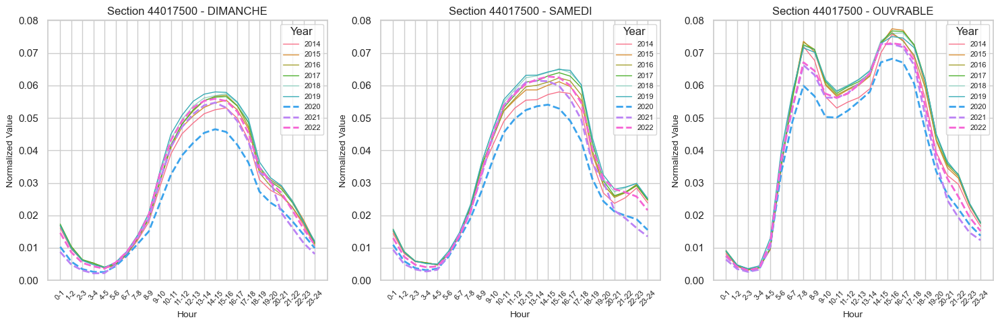

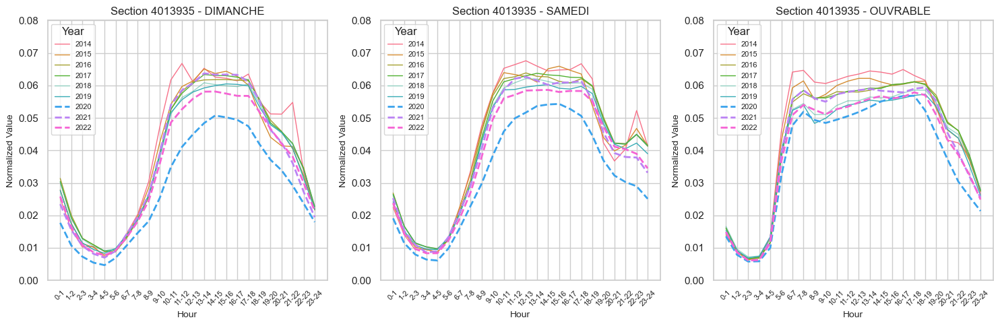

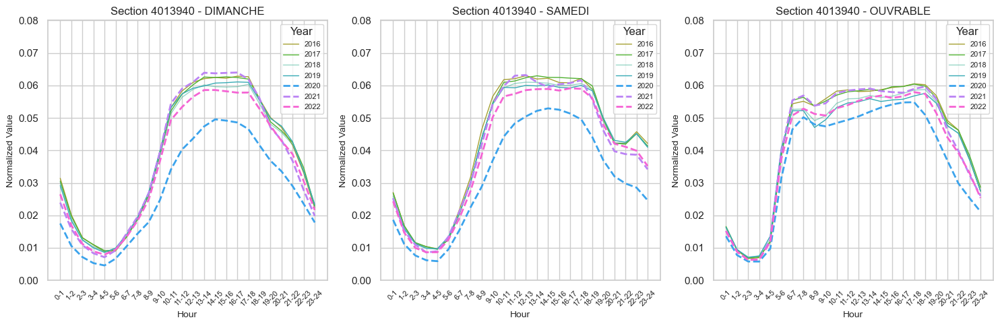

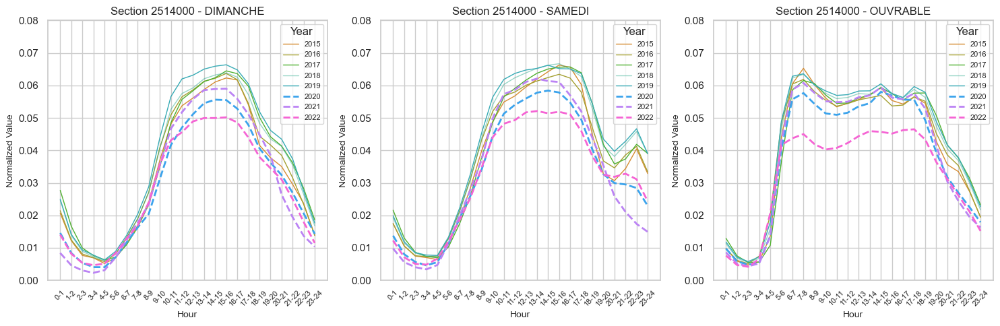

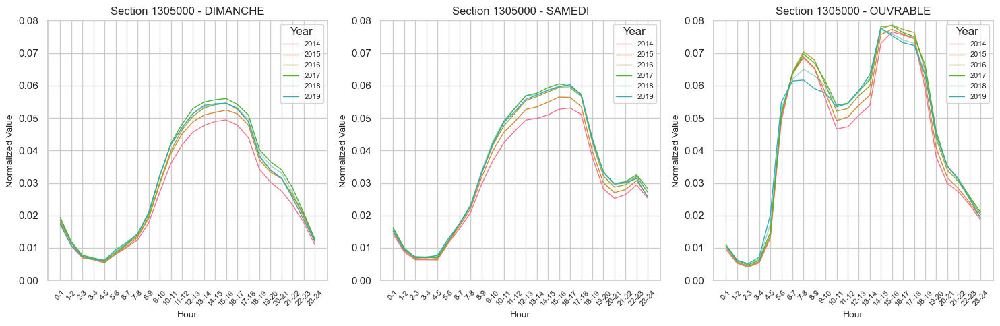

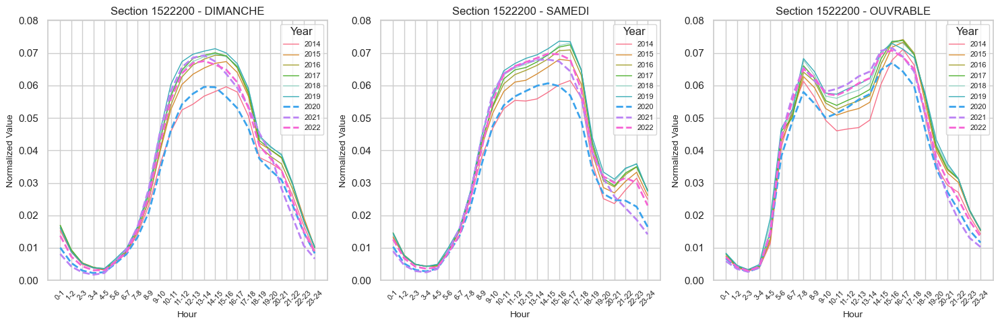

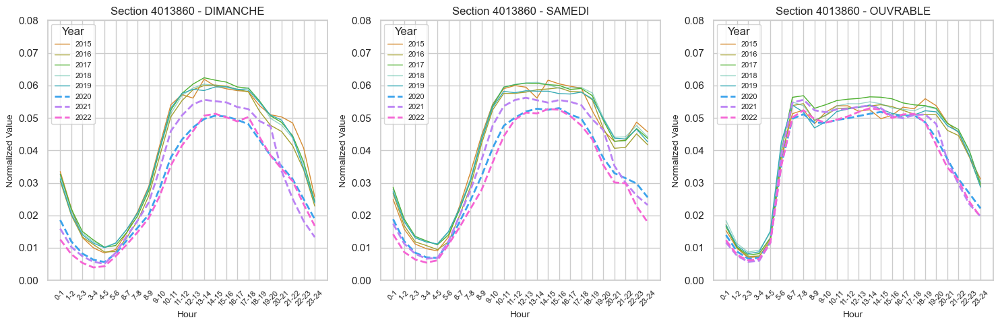

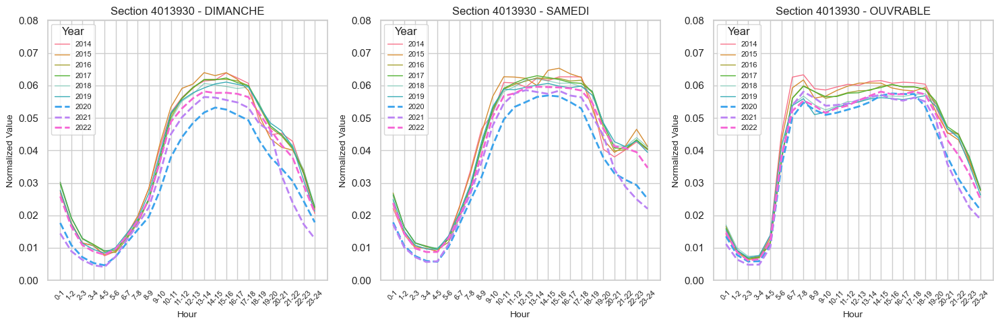

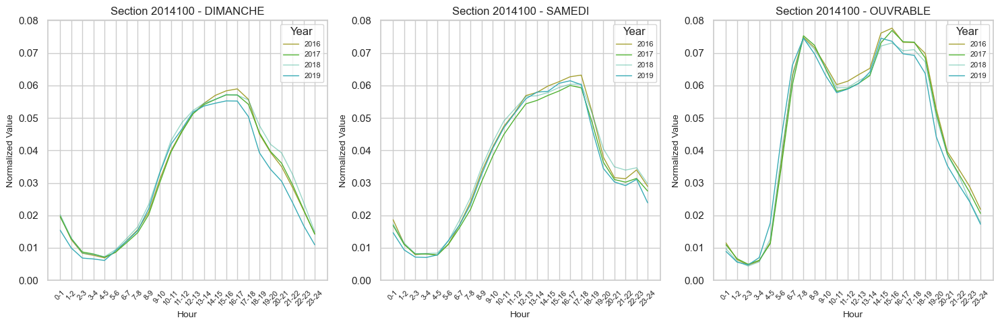

In [95]:
# Create a new figure for each section
for section in section_names:
    plt.figure(figsize=(15, 5))
    
    # Iterate over each day and create a subplot
    for i, day in enumerate(days):
        ax = plt.subplot(1, len(days), i + 1)
        
        # Filter data for the current section and day
        data = merged_data[(merged_data['SECTN'].astype(str) == section) & (merged_data[day].notnull())].copy()
        
        # Convert 'HRE' column to ordered categorical data
        data['HRE'] = pd.Categorical(data['HRE'], categories=hour_order, ordered=True)
        data = data.sort_values('HRE')
        
        # Set y-axis limit (adjust as needed)
        y_max = 0.15
        
        # Check if there's data for this section and day
        if not data.empty:
            # Normalize values by dividing by DJMA for the corresponding section
            data[day] = data[day] / data['DJMA']

            # Iterate over years
            for year in sorted(data['ANNEE'].unique()):
                # Filter data for the current year
                year_data = data[data['ANNEE'] == year]

                # Get hours and normalized values for the current year and day
                hours = year_data['HRE']
                values = year_data[day]

                # Use the defined color for the year
                color = year_colors.get(year, 'k')  # Default to black if color is not defined

                # Set line style and label
                line_style = line_styles.get(year, '-')
                line_width = line_widths.get(year, 1)
                line_alpha = 1.0 if year != 2018 else 0.5
                label = str(year) if year != 2018 else "2018"

                # Plot the curve with the specified color, line style, and width
                sns.lineplot(x=hours, y=values, label=label, linestyle=line_style,
                             linewidth=line_width, alpha=line_alpha, color=color)

            # Set subplot title and labels
            plt.title(f'Section {section} - {day}', fontsize=12)
            plt.xlabel('Hour', fontsize=10)
            plt.ylabel('Normalized Value', fontsize=10)
            plt.legend(title='Year', fontsize=8)
            plt.xticks(rotation=45, fontsize=8)
            plt.ylim(0, 0.08)  # Set the y-axis limit
    
    # Show the plot for each section
    plt.tight_layout()
    plt.show()



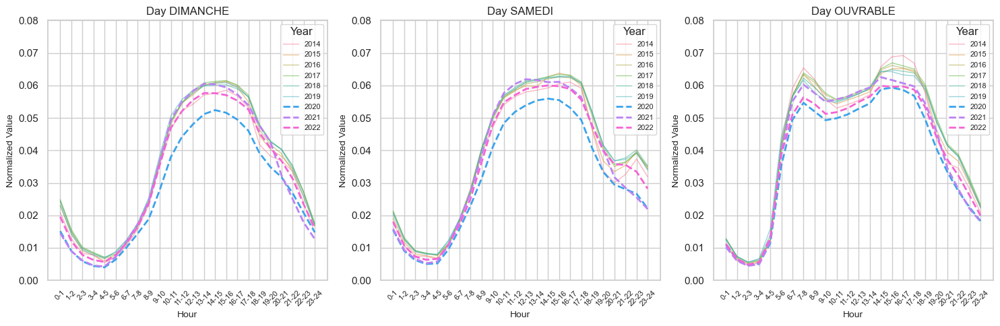

In [96]:
# Create a new figure
plt.figure(figsize=(15, 5))

# Iterate over each day and create a subplot
for i, day in enumerate(days):
    ax = plt.subplot(1, len(days), i + 1)

    # Create an empty DataFrame to store the average results
    avg_data = pd.DataFrame()

    # Iterate over each section and calculate the average for the current day
    for section in section_names:
        data = merged_data[(merged_data['SECTN'].astype(str) == section) & (merged_data[day].notnull())]

        if not data.empty:
            data = data.copy()
            data['HRE'] = pd.Categorical(data['HRE'], categories=hour_order, ordered=True)  # Order the hours
            data = data.sort_values('HRE')  # Sort by hours
            data[day] = data[day] / data['DJMA']  # Normalize values
            avg_data = pd.concat([avg_data, data])

    # Calculate the average for the current day across all sections
    avg_values = avg_data.groupby(['ANNEE', 'HRE'])[day].mean().reset_index()

    # Iterate over years
    for year in sorted(avg_values['ANNEE'].unique()):
        # Filter data for the current year
        year_data = avg_values[avg_values['ANNEE'] == year]

        # Get hours and average values for the current year and day
        hours = year_data['HRE']
        values = year_data[day]

        # Use the defined color for the year
        color = year_colors.get(year, 'k')  # Default to black if color is not defined

        # Set line style and label
        line_style = line_styles.get(year, '-')
        line_width = line_widths.get(year, 1)
        line_alpha = 1.0 if year in [2020, 2021, 2022] else 0.5
        label = str(year) if year != 2018 else "2018"

        # Plot the curve with the specified color, line style, and width
        sns.lineplot(x=hours, y=values, label=label, linestyle=line_style,
                     linewidth=line_width, alpha=line_alpha, color=color)

    # Set subplot title and labels
    plt.title(f'Day {day}', fontsize=12)
    plt.xlabel('Hour', fontsize=10)
    plt.ylabel('Normalized Value', fontsize=10)
    plt.legend(title='Year', fontsize=8)
    plt.xticks(rotation=45, fontsize=8)
    plt.ylim(0, 0.08)  # Set the y-axis limit

# Show the single plot for all sections and days
plt.tight_layout()
plt.show()


In [97]:
# Select the columns to be normalized
columns_to_normalize = ['DIMANCHE', 'LUNDI', 'MARDI', 'MERCREDI', 'JEUDI', 'VENDREDI', 'SAMEDI', 'MOYEN']

# Divide the selected columns by the 'DJMA' column
merged_data_fact84[columns_to_normalize] = merged_data_fact84[columns_to_normalize].div(merged_data_fact84['DJMA'], axis=0)

# Create the new DataFrame
top10_data_fact84_normalized = merged_data_fact84

In [98]:
# Group by 'ANNEE' and 'MOIS' columns and apply custom aggregation function to all day columns
averages_fact84 = top10_data_fact84_normalized.groupby(['ANNEE', 'MOIS']).agg({
    'DIMANCHE': custom_mean,
    'LUNDI': custom_mean,
    'MARDI': custom_mean,
    'MERCREDI': custom_mean,
    'JEUDI': custom_mean,
    'VENDREDI': custom_mean,
    'SAMEDI': custom_mean,
    'MOYEN': custom_mean
})
# Extract 'ANNEE' and 'MOIS' from the index and add them as columns
averages_fact84.reset_index(inplace=True)

# Define the desired order of months
month_order = ['Janvier', 'Février', 'Mars', 'Avril', 'Mai', 'Juin', 'Juillet', 'Août', 'Septembre', 'Octobre', 'Novembre', 'Décembre']

# Convert the 'MOIS' column to the ordered categorical data type
averages_fact84['MOIS'] = pd.Categorical(averages_fact84['MOIS'], categories=month_order, ordered=True)

# Sort the DataFrame by the 'MOIS' column
averages_fact84 = averages_fact84.sort_values('MOIS')

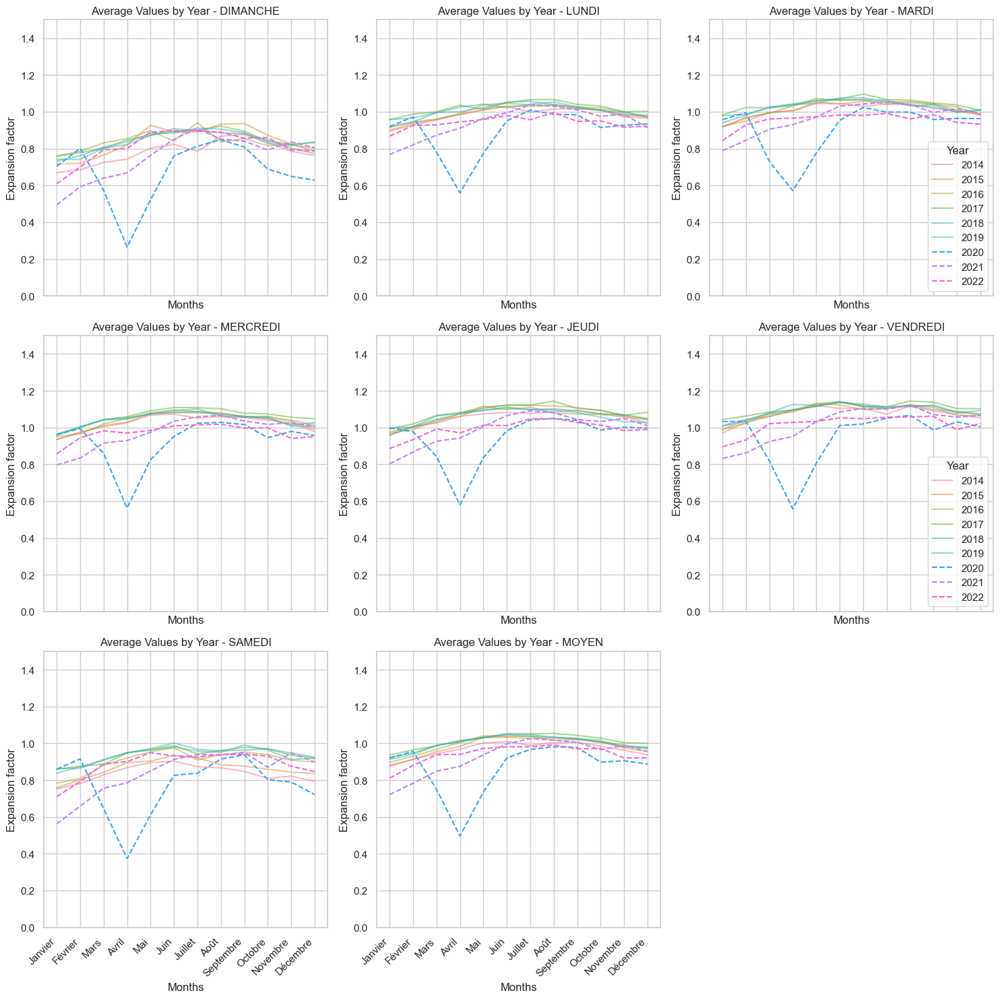

In [99]:
# Pivot the data to have days as columns and months as index
pivot_table = averages_fact84.pivot(index='MOIS', columns='ANNEE')

# Reorder the pivot table based on the month order
pivot_table = pivot_table.reindex(month_order)

# Get the unique years in the data
years = pivot_table.columns.get_level_values('ANNEE').unique()

# Calculate the number of subplots
num_plots = len(pivot_table.columns.get_level_values(0).unique())
num_rows = (num_plots - 1) // 3 + 1

# Create the grid of subplots
fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows), sharex=True)

# Flatten the axes array
axes = axes.flatten()

# Define line styles for highlighting
highlight_styles = ['--', '--', '--']

# set the range
y_min = 0
y_max = 1.5

# Plot a single curve per year for each day
for i, day in enumerate(pivot_table.columns.get_level_values(0).unique()):
    ax = axes[i]
    ax.set_ylim(y_min, y_max)
    for j, year in enumerate(years):
        line_style = highlight_styles[j % len(highlight_styles)] if year in [2020, 2021, 2022] else '-'
        line_alpha = 1.0 if year in [2020, 2021, 2022] else 0.5
        line_width = 3.0 if year in [2020, 2021, 2022] else 1

        # Use the specified color for the year from year_colors_fact84
        color = year_colors_fact84.get(year, 'k')  # Default to black if color is not defined

        ax.plot(pivot_table.index, pivot_table[(day, year)], label=f'{year}', linestyle=line_style, alpha=line_alpha, color=color)

    ax.set_ylabel('Expansion factor')
    ax.set_title(f'Average Values by Year - {day}')
    ax.set_xticks(range(len(pivot_table.index)))  # Set x-ticks
    ax.set_xticklabels(pivot_table.index, rotation=45, ha='right')  # Set x-tick labels

    if i == 2 or i == 5:
        ax.legend(title='Year')
    else:
        ax.legend().set_visible(False)  # Hide legend for other subplots

    # Show x-axis labels for all subplots
    ax.set_xlabel('Months')

# Hide unused subplots
for j in range(num_plots, num_rows * 3):
    fig.delaxes(axes[j])

# Adjust the spacing between subplots
fig.tight_layout()

# Display the plots
plt.show()

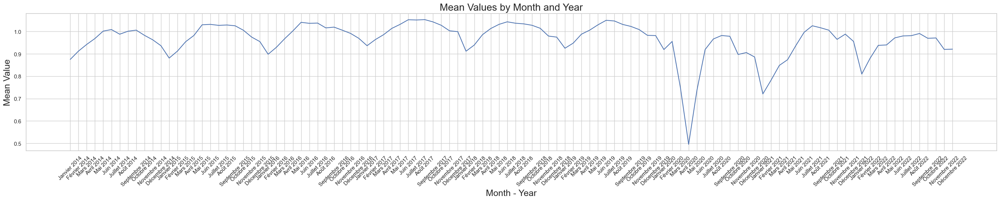

In [100]:
# Define the order of months
month_order = ['Janvier', 'Février', 'Mars', 'Avril', 'Mai', 'Juin', 'Juillet', 'Août', 'Septembre', 'Octobre', 'Novembre', 'Décembre']

# Create empty lists for x-axis labels and y-values
x_labels = []
y_values = []

# Iterate over each year and month
for year in range(2014, 2023):
    for month in month_order:
        data = averages_fact84[(averages_fact84['MOIS'] == month) & (averages_fact84['ANNEE'] == year)]
        if not data.empty:
            x_labels.append(f"{month} {year}")
            y_values.append(data[['DIMANCHE', 'LUNDI', 'MARDI', 'MERCREDI', 'JEUDI', 'VENDREDI', 'SAMEDI']].values[0].mean())

# Increase the figure size
plt.figure(figsize=(35, 5))
# Create the plot
plt.plot(x_labels, y_values)

# Set the x-axis label and ticks
plt.xlabel('Month - Year', fontsize = 18)
plt.xticks(rotation=45)

# Set the y-axis label
plt.ylabel('Mean Value', fontsize = 18)

# Set the title of the plot
plt.title('Mean Values by Month and Year', fontsize = 20)

# Display the plot
plt.show()


#### Agregation (average and median) per region using the normalized traffic volume

In [178]:
# Load the shapefile
shapefile_path = 'cir_v_geo_sectn_trafc_locls/cir_v_geo_sectn_trafc_locls.shp'
gdf = gpd.read_file(shapefile_path)
regions_gdf = gpd.read_file('Sda/version_courante/SHP/regio_s.shp')

In [179]:
# Filter the GeoDataFrame based on 'num_sectn_' column matching values in 'subfolder'
filtered_gdf = gdf[gdf['num_sectn_'].isin(subfolders)]

In [180]:
gdf = gdf.to_crs(regions_gdf.crs)
filtered_gdf = filtered_gdf.to_crs(regions_gdf.crs)

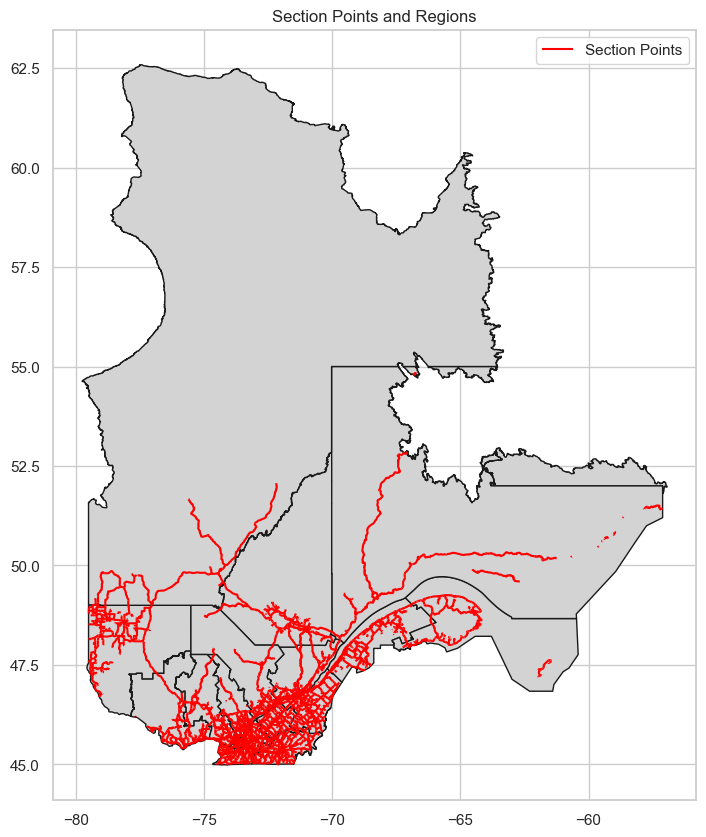

In [181]:
# Create a figure and axis for the map
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the regions as polygons
regions_gdf.plot(ax=ax, color='lightgray', edgecolor='k')

# Plot the section points
gdf.plot(ax=ax, markersize=10, color='red', label='Section Points')

# Set plot title and legend
plt.title('Section Points and Regions')
plt.legend()

# Show the map
plt.show()

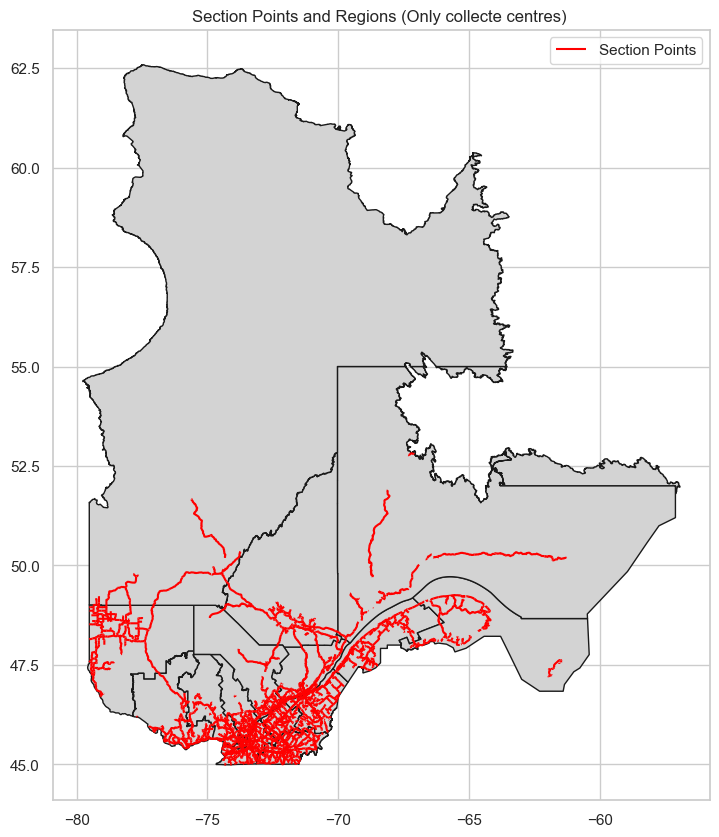

In [182]:
# Create a figure and axis for the map
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the regions as polygons
regions_gdf.plot(ax=ax, color='lightgray', edgecolor='k')

# Plot the section points
filtered_gdf.plot(ax=ax, markersize=10, color='red', label='Section Points')

# Set plot title and legend
plt.title('Section Points and Regions (Only collecte centres) ')
plt.legend()

# Show the map
plt.show()

In [183]:

# Perform a spatial join between the two GeoDataFrames
joined_gdf = gpd.sjoin(filtered_gdf, regions_gdf, how="left", op="within")

# Extract the columns of interest
result_df = joined_gdf[['num_sectn_', 'RES_NM_REG']]

# Drop duplicates if necessary
result_df = result_df.drop_duplicates()

# Reset the index
result_df.reset_index(drop=True, inplace=True)

# Drop duplicates if necessary
result_df = result_df.drop_duplicates()

# Reset the index
result_df.reset_index(drop=True, inplace=True)

# Display the resulting DataFrame
print(result_df)

      num_sectn_          RES_NM_REG
0     0013940000                 NaN
1     0011648000    Centre-du-Québec
2     0002505006          Montérégie
3     0007343000                 NaN
4     0032520000          Montérégie
...          ...                 ...
4883  0052012002            Montréal
4884  0036915000  Capitale-Nationale
4885  0002004700          Montérégie
4886  0036030000  Capitale-Nationale
4887  0013824100          Lanaudière

[4888 rows x 2 columns]


/Users/tarcisio/opt/anaconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3445: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


In [184]:
# Count the number of duplicates in the 'num_sectn_' column
num_duplicates = result_df['num_sectn_'].duplicated().sum()

# Print the count of duplicates
print(f"Number of duplicates in 'num_sectn_': {num_duplicates}")

Number of duplicates in 'num_sectn_': 0


In [185]:
# Count the number of NaN values in the 'RES_NM_REG' column
num_nan_values = result_df['RES_NM_REG'].isna().sum()

# Print the count of NaN values
print(f"Number of NaN values in 'RES_NM_REG': {num_nan_values}")

Number of NaN values in 'RES_NM_REG': 125


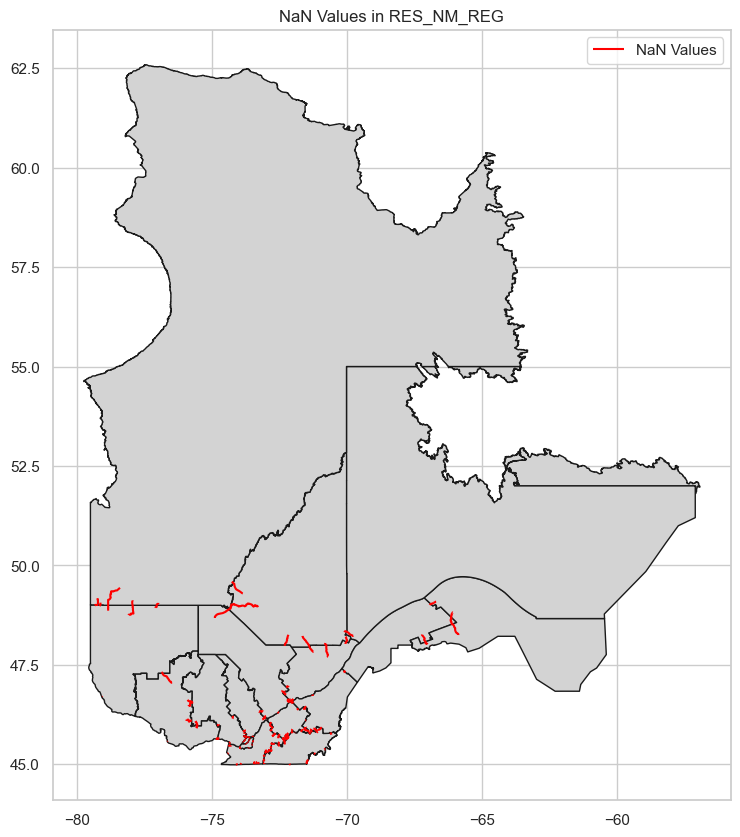

In [186]:
# Create a figure and axis for the map
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the regions as polygons
regions_gdf.plot(ax=ax, color='lightgray', edgecolor='k')

# Filter the joined GeoDataFrame to get rows with NaN values in 'RES_NM_REG'
nan_values_gdf = joined_gdf[joined_gdf['RES_NM_REG'].isna()]

# Plot the points with NaN values
nan_values_gdf.plot(ax=ax, markersize=10, color='red', label='NaN Values')

# Set plot title and legend
plt.title('NaN Values in RES_NM_REG')
plt.legend()

# Show the map
plt.show()

In [187]:
# Perform a spatial join
joined_gdf = gpd.sjoin(filtered_gdf, regions_gdf, how="left", op="intersects")

# Count the number of unique regions each section intersects with
section_region_counts = joined_gdf.groupby('num_sectn_')['RES_NM_REG'].nunique()

# Filter sections that intersect with more than one region
sections_passing_multiple_regions = section_region_counts[section_region_counts > 1].index

# Display the sections passing through multiple regions
print(sections_passing_multiple_regions)

/Users/tarcisio/opt/anaconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3445: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


Index(['0001017500', '0001305000', '0001307500', '0001519000', '0001520500',
       '0001930000', '0002008000', '0002039000', '0002047500', '0002067500',
       ...
       '4562510000', '6558002000', '7229101000', '7278001000', '7278002000',
       '7290100100', '7774002000', '7836301000', '8360003000', '8497001000'],
      dtype='object', name='num_sectn_', length=109)


In [188]:
# Count the number of sections that intersect with multiple regions
num_sections_passing_multiple_regions = len(sections_passing_multiple_regions)

# Display the count
print(f"Number of sections passing through multiple regions: {num_sections_passing_multiple_regions}")

Number of sections passing through multiple regions: 109


In [189]:
# Perform a spatial join
joined_gdf = gpd.sjoin(filtered_gdf, regions_gdf, how="left", op="intersects")

# Count the number of unique regions each section intersects with
section_region_counts = joined_gdf.groupby('num_sectn_')['RES_NM_REG'].nunique()

# Filter sections that intersect with more than one region
sections_passing_multiple_regions = section_region_counts[section_region_counts > 1].index

# Create a DataFrame with section names and a list of region names
section_region_df = joined_gdf[joined_gdf['num_sectn_'].isin(sections_passing_multiple_regions)][['num_sectn_', 'RES_NM_REG']]

# Group by section and aggregate the list of region names
section_region_df = section_region_df.groupby('num_sectn_')['RES_NM_REG'].apply(lambda x: 'Intersection: ' + ' + '.join(x)).reset_index()

# Create a GeoDataFrame from the DataFrame
geometry = filtered_gdf.geometry  # Use the geometry from the original GeoDataFrame
gdf_with_intersection = gpd.GeoDataFrame(section_region_df, geometry=geometry)

# Display the GeoDataFrame
print(gdf_with_intersection)

/Users/tarcisio/opt/anaconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3445: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


     num_sectn_                                   RES_NM_REG   
0    0001017500            Intersection: Montérégie + Estrie  \
1    0001305000               Intersection: Montréal + Laval   
2    0001307500            Intersection: Laval + Laurentides   
3    0001519000               Intersection: Montréal + Laval   
4    0001520500            Intersection: Laval + Laurentides   
..          ...                                          ...   
104  7290100100      Intersection: Centre-du-Québec + Estrie   
105  7774002000      Intersection: Centre-du-Québec + Estrie   
106  7836301000      Intersection: Centre-du-Québec + Estrie   
107  8360003000  Intersection: Estrie + Chaudière-Appalaches   
108  8497001000  Intersection: Estrie + Chaudière-Appalaches   

                                              geometry  
0    LINESTRING (-72.56177 45.65936, -72.56177 45.6...  
1    LINESTRING (-71.99699 45.94951, -71.99661 45.9...  
2    LINESTRING (-73.47579 45.57844, -73.47537 45.5...  
3  

In [190]:
# Drop the 'geometry' column
gdf_with_intersection = gdf_with_intersection.drop(columns='geometry')

# Convert the GeoDataFrame to a DataFrame
df_from_gdf = pd.DataFrame(gdf_with_intersection)

# Display the resulting DataFrame
print(df_from_gdf)

     num_sectn_                                   RES_NM_REG
0    0001017500            Intersection: Montérégie + Estrie
1    0001305000               Intersection: Montréal + Laval
2    0001307500            Intersection: Laval + Laurentides
3    0001519000               Intersection: Montréal + Laval
4    0001520500            Intersection: Laval + Laurentides
..          ...                                          ...
104  7290100100      Intersection: Centre-du-Québec + Estrie
105  7774002000      Intersection: Centre-du-Québec + Estrie
106  7836301000      Intersection: Centre-du-Québec + Estrie
107  8360003000  Intersection: Estrie + Chaudière-Appalaches
108  8497001000  Intersection: Estrie + Chaudière-Appalaches

[109 rows x 2 columns]


In [191]:
# Create a dictionary to map matching values
replacement_dict = df_from_gdf.set_index('num_sectn_')['RES_NM_REG'].to_dict()

# Replace values in the RES_NM_REG column based on matching num_sectn_
result_df['RES_NM_REG'] = result_df['num_sectn_'].map(replacement_dict).fillna(result_df['RES_NM_REG'])

# Print the modified result_df
print(result_df)

      num_sectn_                                         RES_NM_REG
0     0013940000        Intersection: Montérégie + Centre-du-Québec
1     0011648000                                   Centre-du-Québec
2     0002505006                                         Montérégie
3     0007343000  Intersection: Chaudière-Appalaches + Capitale-...
4     0032520000                                         Montérégie
...          ...                                                ...
4883  0052012002                                           Montréal
4884  0036915000                                 Capitale-Nationale
4885  0002004700                                         Montérégie
4886  0036030000                                 Capitale-Nationale
4887  0013824100                                         Lanaudière

[4888 rows x 2 columns]


In [195]:
# Count the number of NaN values in the 'RES_NM_REG' column
num_nan_values = result_df['RES_NM_REG'].isna().sum()

# Print the count of NaN values
print(f"Number of NaN values in 'RES_NM_REG': {num_nan_values}")

Number of NaN values in 'RES_NM_REG': 16


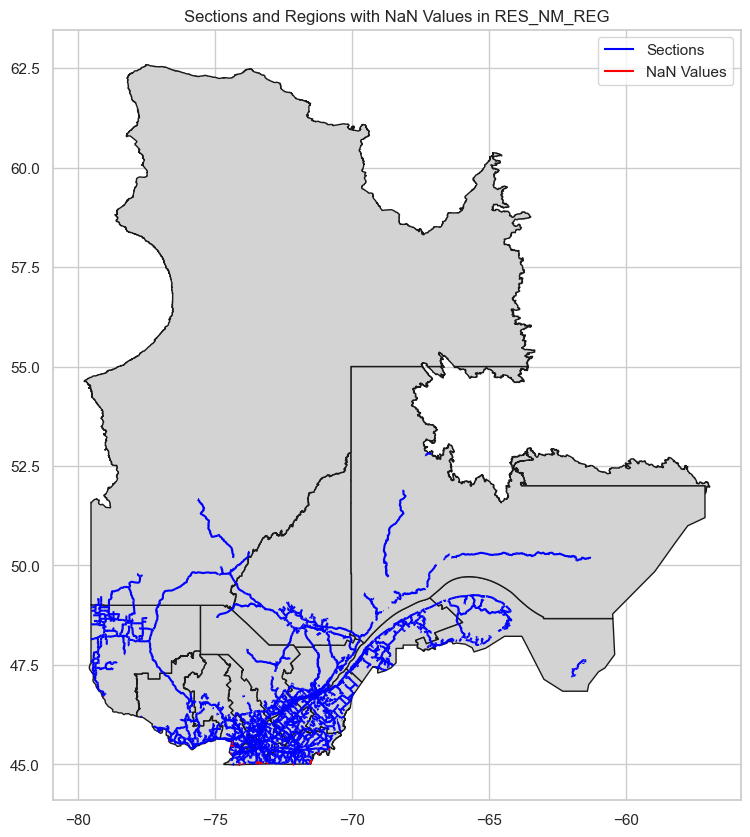

In [193]:
# Merge the filtered_gdf with result_df based on the 'num_sectn_' column
merged_gdf = filtered_gdf.merge(result_df, on='num_sectn_', how='left')

# Create a figure and axis for the map
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the regions as polygons
regions_gdf.plot(ax=ax, color='lightgray', edgecolor='k')

# Plot the sections as points
filtered_gdf.plot(ax=ax, markersize=10, color='blue', label='Sections')

# Plot the sections from merged_gdf where RES_NM_REG is NaN
merged_gdf[merged_gdf['RES_NM_REG'].isna()].plot(ax=ax, markersize=10, color='red', label='NaN Values')

# Set plot title and legend
plt.title('Sections and Regions with NaN Values in RES_NM_REG')
plt.legend()

# Show the map
plt.show()

/var/folders/hj/qn7q0z59489b09p94rxg0t6m0000gn/T/ipykernel_48877/575385232.py:17: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(regions_gdf.geometry.centroid.x, regions_gdf.geometry.centroid.y, regions_gdf['RES_NM_REG']):


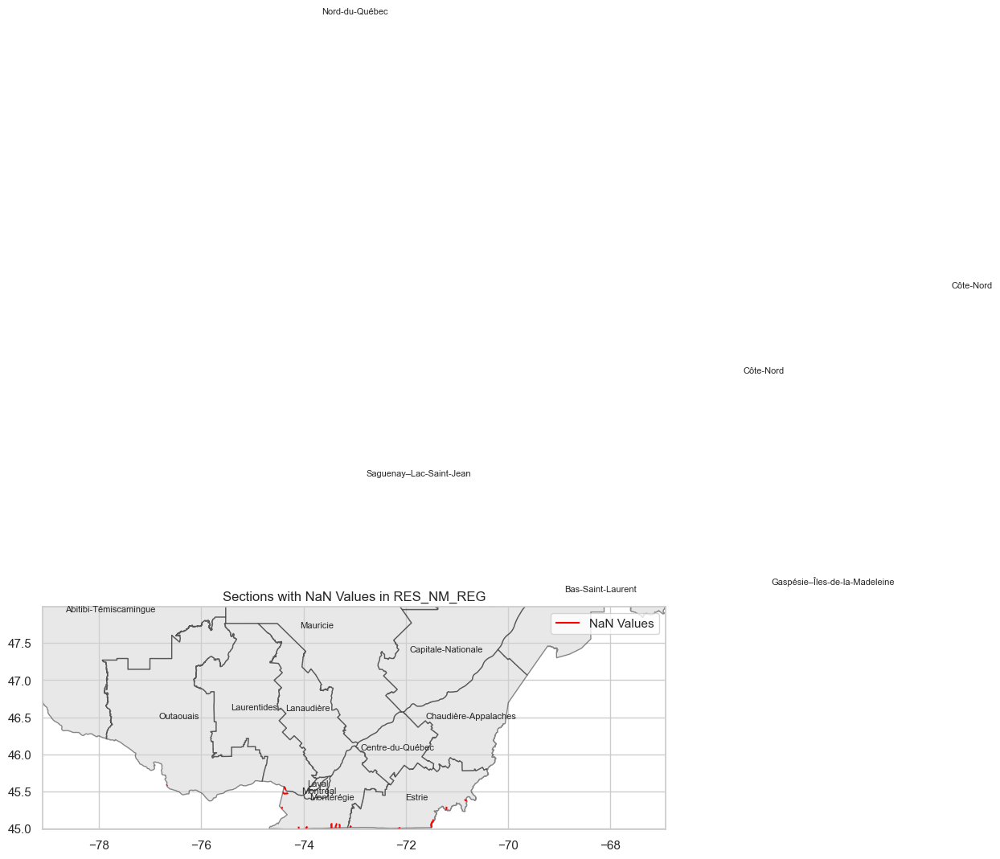

In [194]:
# Merge the filtered_gdf with result_df based on the 'num_sectn_' column
merged_gdf = filtered_gdf.merge(result_df, on='num_sectn_', how='left')

# Filter sections in merged_gdf where RES_NM_REG is NaN
sections_with_nan = merged_gdf[merged_gdf['RES_NM_REG'].isna()]

# Create a figure and axis for the map
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the regions as polygons
regions_gdf.plot(ax=ax, color='lightgray', edgecolor='k', alpha=0.5)

# Plot the sections with NaN values as points
sections_with_nan.plot(ax=ax, markersize=10, color='red', label='NaN Values')

# Add region names as labels
for x, y, label in zip(regions_gdf.geometry.centroid.x, regions_gdf.geometry.centroid.y, regions_gdf['RES_NM_REG']):
    ax.text(x, y, label, fontsize=8, ha='center', va='center')

# Set plot title and legend
plt.title('Sections with NaN Values in RES_NM_REG')
plt.legend()

# Set plot limits to zoom in on sections with NaN values
ax.set_xlim(sections_with_nan.geometry.total_bounds[[0, 2]])
ax.set_ylim(sections_with_nan.geometry.total_bounds[[1, 3]])

# Show the map
plt.show()

#### HOURS AND DAYS PER REGIONS

In [196]:
print(aggregated_data_djmm.head())

     SECTN ANNEE VOIE       MO  HRE_MAX   JR_MAX   DJMM TOT_MOIS RES_NM_REG
0  5512000  2016   13  Janvier      NaN      NaN  10600   328600     Estrie
1  5512000  2016   13  Février   1550.0  14400.0  11300   327700     Estrie
2  5512000  2016   13     Mars   1530.0  14700.0  11900   368900     Estrie
3  5512000  2016   13    Avril   1550.0  15500.0  12200   366000     Estrie
4  5512000  2016   13      Mai      NaN      NaN  12900   399900     Estrie


In [197]:
print(result_df.head())


   num_sectn_                                         RES_NM_REG
0  0013940000        Intersection: Montérégie + Centre-du-Québec
1  0011648000                                   Centre-du-Québec
2  0002505006                                         Montérégie
3  0007343000  Intersection: Chaudière-Appalaches + Capitale-...
4  0032520000                                         Montérégie


In [198]:
# Create a copy of result_df named result_df_SECTN
result_df_SECTN = result_df.copy()

# Loop through SECTN values
for sectn in aggregated_data_djmm['SECTN']:
    # Check for partial matches in result_df_SECTN
    partial_match = result_df_SECTN[result_df_SECTN['num_sectn_'].str.contains(str(sectn), na=False, case=False)]
    
    # If there are matches, replace the values in result_df_SECTN
    if not partial_match.empty:
        result_df_SECTN.loc[partial_match.index, 'num_sectn_'] = sectn

# Print the updated result_df_SECTN
print(result_df_SECTN)

      num_sectn_                                         RES_NM_REG
0     0013940000        Intersection: Montérégie + Centre-du-Québec
1       11648000                                   Centre-du-Québec
2     0002505006                                         Montérégie
3        7343000  Intersection: Chaudière-Appalaches + Capitale-...
4        2520000                                         Montérégie
...          ...                                                ...
4883  0052012002                                           Montréal
4884  0036915000                                 Capitale-Nationale
4885     2004700                                         Montérégie
4886  0036030000                                 Capitale-Nationale
4887  0013824100                                         Lanaudière

[4888 rows x 2 columns]


In [199]:
# Count the number of NaN values in the 'RES_NM_REG' column
num_nan_values_sectn = result_df_SECTN['RES_NM_REG'].isna().sum()

# Print the count of NaN values
print(f"Number of NaN values in 'RES_NM_REG': {num_nan_values_sectn}")

Number of NaN values in 'RES_NM_REG': 16


In [168]:
value_to_check = 1305000
is_present = value_to_check in result_df['num_sectn_'].values

if is_present:
    print(f"The value {value_to_check} is present in the 'num_sectn_' column.")
else:
    print(f"The value {value_to_check} is not present in the 'num_sectn_' column.")

The value 1305000 is present in the 'num_sectn_' column.


In [200]:
# Count the number of matching values
num_matches = result_df_SECTN['num_sectn_'].isin(aggregated_data_djmm['SECTN']).sum()

# Print the number of matches
print(f"Number of matching values: {num_matches}")

Number of matching values: 455


In [201]:
# Create a dictionary to map 'num_sectn_' to 'RES_NM_REG'
sectn_to_res_nm_reg = result_df_SECTN.set_index('num_sectn_')['RES_NM_REG'].to_dict()

# Add a new column 'RES_NM_REG' to 'aggregated_data_djmm' based on the mapping
aggregated_data_djmm['RES_NM_REG'] = aggregated_data_djmm['SECTN'].map(sectn_to_res_nm_reg)

In [202]:
print(aggregated_data_djmm)

         SECTN ANNEE VOIE         MO  HRE_MAX   JR_MAX   DJMM TOT_MOIS   
0      5512000  2016   13    Janvier      NaN      NaN  10600   328600  \
1      5512000  2016   13    Février   1550.0  14400.0  11300   327700   
2      5512000  2016   13       Mars   1530.0  14700.0  11900   368900   
3      5512000  2016   13      Avril   1550.0  15500.0  12200   366000   
4      5512000  2016   13        Mai      NaN      NaN  12900   399900   
...        ...   ...  ...        ...      ...      ...    ...      ...   
27273  2033000  2020   13       Août      NaN      NaN  59000  1829000   
27274  2033000  2020   13  Septembre   5910.0  77000.0  59000  1770000   
27275  2033000  2020   13    Octobre      NaN      NaN  49000  1519000   
27276  2033000  2020   13   Novembre   4980.0  60000.0  50000  1500000   
27277  2033000  2020   13   Décembre   4800.0  57000.0  48000  1488000   

      RES_NM_REG  
0         Estrie  
1         Estrie  
2         Estrie  
3         Estrie  
4         Estrie

In [207]:
# Filter data for the year 2018
filtered_data_2018 = aggregated_data_djmm[aggregated_data_djmm['ANNEE'] == 2018]

# Group by 'SECTN' and 'ANNEE', calculate DJMA, and sum TOT_MOIS
grouped_data = filtered_data_2018.groupby(['SECTN', 'ANNEE'])['TOT_MOIS'].sum() / 365

# Reset the index to make SECTN and ANNEE columns again
grouped_data = grouped_data.reset_index()
# Rename the 'TOT_MOIS' column to 'DJMA'
grouped_data = grouped_data.rename(columns={'TOT_MOIS': 'DJMA'})
print(grouped_data.head())

     SECTN  ANNEE          DJMA
0  1012500   2018   83027.39726
1  1015500   2018  39616.438356
2  1023500   2018   33186.30137
3  1301500   2018  79276.712329
4  1301800   2018  85446.575342


In [208]:
# Merge aggregated_data_hour with top_10_sections
merged_data = pd.merge(aggregated_data_hour, grouped_data[['SECTN', 'DJMA']], on='SECTN')
merged_data_fact84 = pd.merge(aggregated_data_fact84, grouped_data[['SECTN', 'DJMA']], on='SECTN')

# Create a list of unique section names
section_names = grouped_data['SECTN'].astype(str)

In [215]:
# calling the function to merge the files result_df_sectn and merged_data
merged_data = map_and_add_res_nm_reg(merged_data, result_df_SECTN)
print(merged_data.head())


     SECTN ANNEE VOIE  HRE  DIMANCHE  SAMEDI  OUVRABLE          DJMA   
0  5512000  2016   13  0-1     185.0   159.0      78.0  13928.493151  \
1  5512000  2016   13  1-2      91.0    73.0      36.0  13928.493151   
2  5512000  2016   13  2-3      47.0    42.0      31.0  13928.493151   
3  5512000  2016   13  3-4      32.0    36.0      35.0  13928.493151   
4  5512000  2016   13  4-5      26.0    41.0      79.0  13928.493151   

  RES_NM_REG  
0     Estrie  
1     Estrie  
2     Estrie  
3     Estrie  
4     Estrie  


In [226]:
# analyse the sections per region
section_counts = merged_data.groupby('RES_NM_REG')['SECTN'].nunique()
print(section_counts)

RES_NM_REG
Abitibi-Témiscamingue                                                 6
Bas-Saint-Laurent                                                    11
Capitale-Nationale                                                   29
Centre-du-Québec                                                     15
Chaudière-Appalaches                                                 12
Côte-Nord                                                             4
Estrie                                                               18
Gaspésie–Îles-de-la-Madeleine                                         5
Intersection: Centre-du-Québec + Mauricie                             1
Intersection: Chaudière-Appalaches + Capitale-Nationale               2
Intersection: Laurentides + Outaouais                                 1
Intersection: Laval + Lanaudière                                      1
Intersection: Laval + Laurentides                                     5
Intersection: Mauricie + Saguenay–Lac-Saint-Jean     

In [218]:
# Extract distinct region names from the 'RES_NM_REG' column
region_names = merged_data['RES_NM_REG'].unique()

# Now you have a list of unique region names in the 'region_names' variable
print(region_names)

['Estrie' 'Laval' 'Gaspésie–Îles-de-la-Madeleine' 'Laurentides'
 'Montérégie' 'Capitale-Nationale' 'Montréal' 'Mauricie'
 'Chaudière-Appalaches' 'Intersection: Montréal + Montérégie'
 'Intersection: Laval + Laurentides' 'Centre-du-Québec'
 'Intersection: Montréal + Laval' nan 'Bas-Saint-Laurent' 'Lanaudière'
 'Saguenay–Lac-Saint-Jean' 'Côte-Nord'
 'Intersection: Laurentides + Outaouais'
 'Intersection: Chaudière-Appalaches + Capitale-Nationale' 'Outaouais'
 'Intersection: Montréal + Lanaudière' 'Abitibi-Témiscamingue'
 'Intersection: Mauricie + Saguenay–Lac-Saint-Jean + Nord-du-Québec'
 'Intersection: Laval + Lanaudière'
 'Intersection: Mauricie + Saguenay–Lac-Saint-Jean'
 'Intersection: Centre-du-Québec + Mauricie'
 'Intersection: Montérégie + Centre-du-Québec']


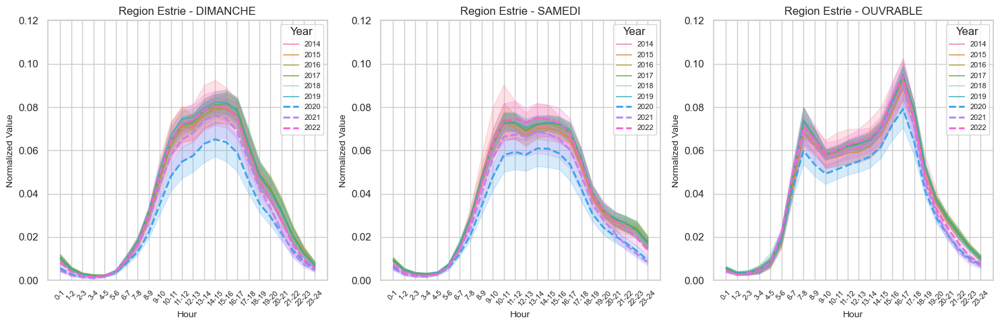

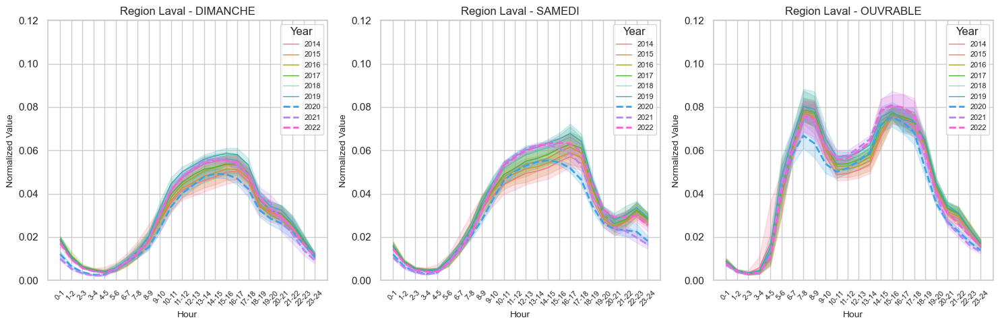

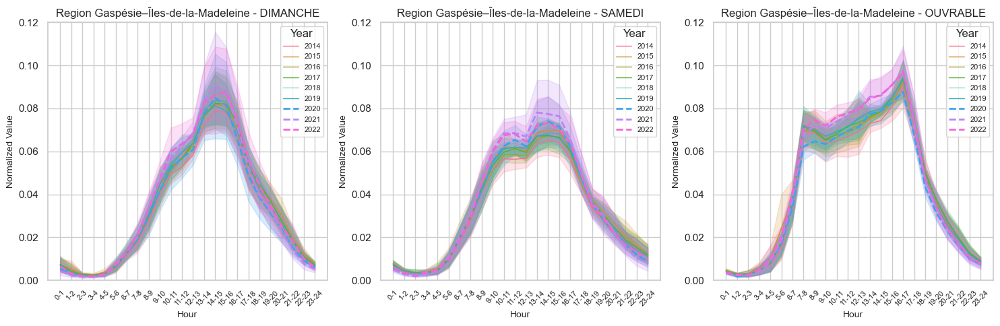

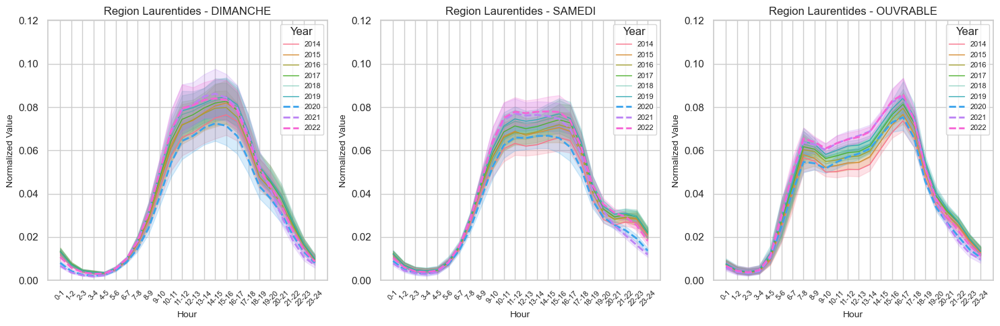

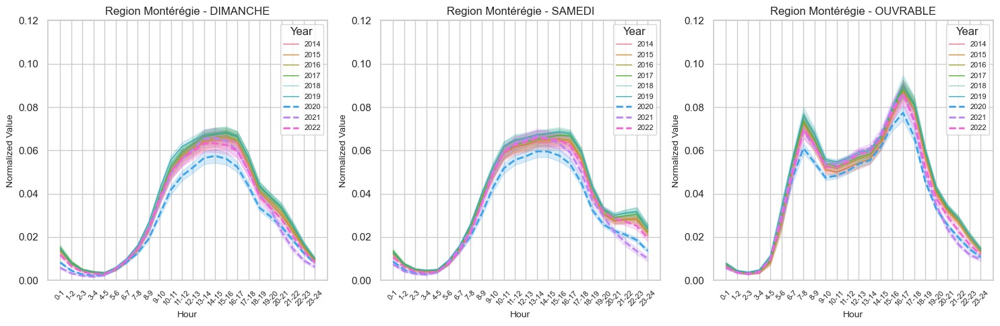

...

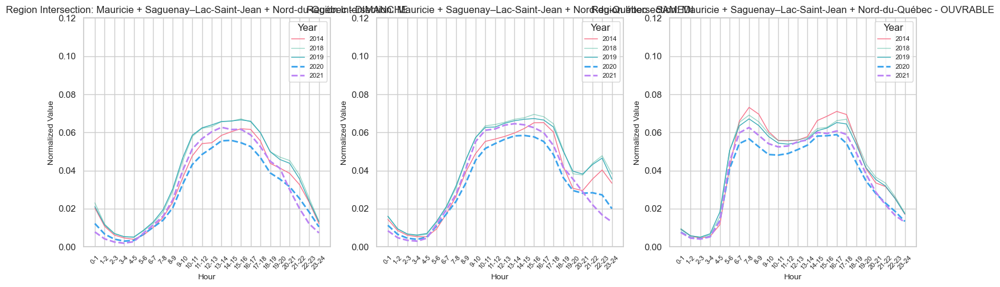

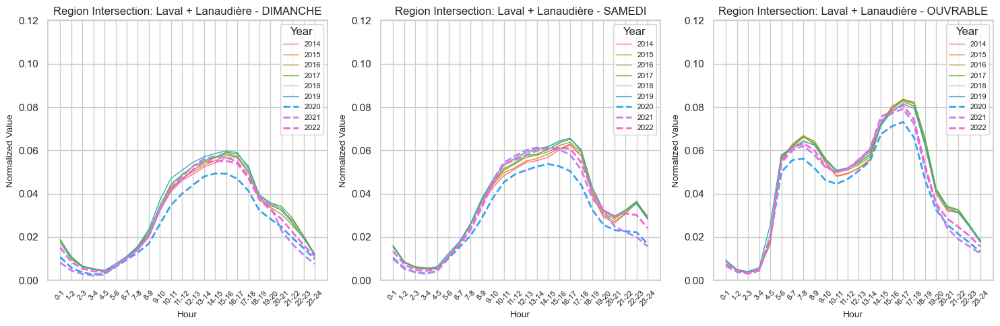

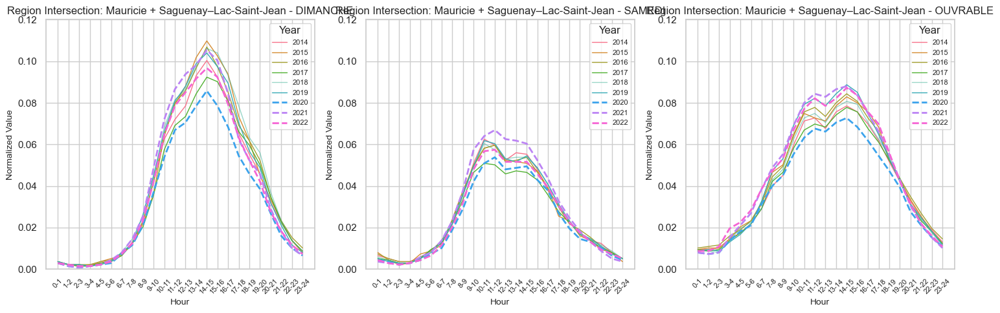

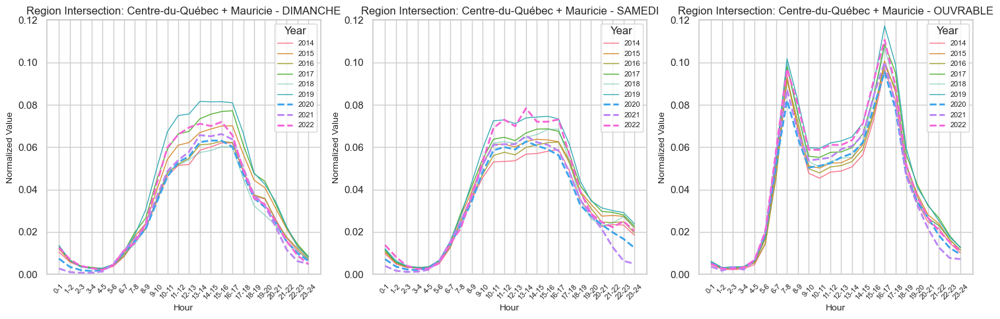

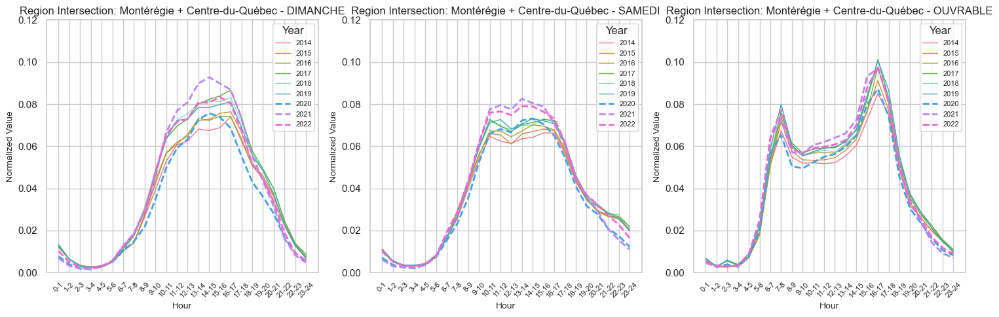

In [225]:
# Create a new figure for each region
for region in region_names:
    plt.figure(figsize=(15, 5))
    
    # Iterate over each day and create a subplot
    for i, day in enumerate(days):
        ax = plt.subplot(1, len(days), i + 1)
        
        # Filter data for the current region and day
        data = merged_data[(merged_data['RES_NM_REG'] == region) & (merged_data[day].notnull())].copy()
        
        # Convert 'HRE' column to ordered categorical data
        data['HRE'] = pd.Categorical(data['HRE'], categories=hour_order, ordered=True)
        data = data.sort_values('HRE')
        
        # Set y-axis limit (adjust as needed)
        y_max = 0.15
        
        # Check if there's data for this region and day
        if not data.empty:
            # Normalize values by dividing by DJMM for the corresponding region
            data[day] = data[day] / data['DJMA']

            # Iterate over years
            for year in sorted(data['ANNEE'].unique()):
                # Filter data for the current year
                year_data = data[data['ANNEE'] == year]

                # Get hours and normalized values for the current year and day
                hours = year_data['HRE']
                values = year_data[day]

                # Use the defined color for the year
                color = year_colors.get(year, 'k')  # Default to black if color is not defined

                # Set line style and label
                line_style = line_styles.get(year, '-')
                line_width = line_widths.get(year, 1)
                line_alpha = 1.0 if year != 2018 else 0.5
                label = str(year) if year != 2018 else "2018"

                # Plot the curve with the specified color, line style, and width
                sns.lineplot(x=hours, y=values, label=label, linestyle=line_style,
                             linewidth=line_width, alpha=line_alpha, color=color)

            # Set subplot title and labels
            plt.title(f'Region {region} - {day}', fontsize=12)
            plt.xlabel('Hour', fontsize=10)
            plt.ylabel('Normalized Value', fontsize=10)
            plt.legend(title='Year', fontsize=8)
            plt.xticks(rotation=45, fontsize=8)
            plt.ylim(0, 0.12)  # Set the y-axis limit
    
    # Show the plot for each region
    plt.tight_layout()
    plt.show()